# Graphing WV-WV networks

In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn
import networkx as nx
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["font.sans-serif"] = "Helvetica"
import bokeh.palettes
mpl.rcParams['figure.dpi'] = 300

## Organizing data

In [81]:
#import connections/synapses data from FlyWire
connections = pd.read_csv('connections_princeton.csv.gz', compression='gzip').drop(columns='neuropil')

#since certain root ids express different neurotransmitters, the same connection shows up multiple times due to different nt types
#group by neurotransmitters, df only keeps connections with primary nt (nt connection highest syn count for each pre root id)
ntsgrouped = connections.groupby(['pre_root_id', 'post_root_id', 'nt_type'], as_index=False)[['syn_count']].sum()

#keep only the strongest connection for duplicate connections with different nt types
conns = ntsgrouped.sort_values(by='syn_count', ascending=False).drop_duplicates(subset=['pre_root_id', 'post_root_id'], keep='first')
conns

,pre_root_id,post_root_id,nt_type,syn_count
3687238,720575940650935673,720575940640736371,GABA,2633
2320879,720575940628069501,720575940633305681,GABA,2597
3596036,720575940644702112,720575940625952755,GABA,2238
1631524,720575940623475324,720575940627497244,GABA,2179
1246516,720575940620975696,720575940624547622,DA,1872
...,...,...,...,...
3073466,720575940633914413,720575940615905130,GLUT,5
1582223,720575940623166600,720575940622950424,ACH,5
3073469,720575940633914413,720575940622525168,GLUT,5
1582220,720575940623166600,720575940618583877,ACH,5


In [82]:
#import cell types dataframe from FlyWire
celltypes = pd.read_csv('consolidated_cell_types.csv.gz', compression='gzip')
celltypes = celltypes.rename(columns={'primary_type':'type'})

#import list of wvwvs from prof. gutierrez
wvwv_bakerlab = pd.read_csv('WV-WV 20250506 - Sheet1.csv')

#make obj names for each wvwv root id for easier querying further down the line
wvwv_rootids = wvwv_bakerlab['Codex Root ID'].tolist()
wvwv1_rootids = (wvwv_bakerlab[wvwv_bakerlab['Cell type'] == 'WV-WV-1'])['Codex Root ID'].tolist()
wvwv2_rootids = (wvwv_bakerlab[wvwv_bakerlab['Cell type'] == 'WV-WV-2'])['Codex Root ID'].tolist()
wvwv3_rootids = (wvwv_bakerlab[wvwv_bakerlab['Cell type'] == 'WV-WV-3'])['Codex Root ID'].tolist()
wvwv4_rootids = (wvwv_bakerlab[wvwv_bakerlab['Cell type'] == 'WV-WV-4'])['Codex Root ID'].tolist()

#changing type names of wv-wv-3s to wv-wv-4s (per Baker et al.)

celltypes.loc[celltypes['root_id'].isin(wvwv4_rootids), 'type']='WV-WV-4'

celltypes


,root_id,type,additional_type(s)
0,720575940596125868,T5c,NaN
1,720575940597856265,Tm16,NaN
2,720575940597944841,Tm7,CB3851
3,720575940598267657,TmY15,NaN
4,720575940599333574,Tm1,NaN
...,...,...,...
137672,720575940661335681,CB0180,NaN
137673,720575940661336193,TmY3,NaN
137674,720575940661337217,KCab-p,NaN
137675,720575940661338497,CB0904,NaN


In [83]:
#import auditory neuron mode preference df from ahmed lab
aud_neurons = pd.read_csv('train_dat.csv')
aud_neurons

#change column names so easier to do operations

aud_neurons = aud_neurons.rename(columns={
    'Flywire 2024 ID':'root_id',
    'Neuropils':'type' 
    }).drop([
        'Unnamed: 0',
        '# imaged females', 
        '# responding females',
        'prop females with auditory responses'], axis=1
        )
aud_neurons

,root_id,type,preference
0,720575940619783518,AVLP_pr01,sine
1,720575940620062633,AVLP_pr01,sine
2,720575940602914988,AVLP_pr01,sine
3,720575940620195719,AVLP_pr01,sine
4,720575940634508174,AVLP_pr01,sine
...,...,...,...
398,720575940655398817,GNG_pr01,sine
399,720575940630203589,GNG_pr01,sine
400,720575940617641077,GNG_pr01,sine
401,720575940612801022,GNG_pr01,sine


In [84]:
#merge celltypes and aud_neurons into one prioritized labels/types df, which will be used first when merging with conns df
#if there is no correpsonding cell type from Baker/Ahmed lab data, then fill in with cell types data from FlyWire

types = pd.merge(
    celltypes,
    aud_neurons,
    on = 'root_id',
    how = 'left',
    suffixes = ('_celltypes', '_aud')
)

types['type'] = types['type_aud'].combine_first(types['type_celltypes'])
types = types[['root_id', 'type', 'preference']]
types

,root_id,type,preference
0,720575940596125868,T5c,NaN
1,720575940597856265,Tm16,NaN
2,720575940597944841,Tm7,NaN
3,720575940598267657,TmY15,NaN
4,720575940599333574,Tm1,NaN
...,...,...,...
137672,720575940661335681,CB0180,NaN
137673,720575940661336193,TmY3,NaN
137674,720575940661337217,KCab-p,NaN
137675,720575940661338497,CB0904,NaN


In [85]:
#Christa Baker just shared the list of auditory neurons with me so I'm going to use this table from ahmed lab twist for classifications (all neurons in this dataframe will be considered auditory)

auditory_cells = pd.read_csv('Auditory neurons Lockwood et al - Sheet1.csv')

#create list of auditory ids for table filtering
aud_ids = auditory_cells['Codex June 2024'].tolist()

#since the baker spreadsheet has better labelling of cell types, see if any cells listed as 'auditory' have generic names, and change if possible

aud_types = types[types['root_id'].isin(aud_ids)][['root_id', 'type']].drop_duplicates()

#since all generic names start with CB filter for those
#renaming generic cell type names with non-generic ones (if possible) will make analysis easier

aud_generic_typenames = aud_types[aud_types['type'].str.contains('CB')]

aud_generic_rootids = aud_generic_typenames['root_id'].tolist()
aud_generic_rootids

[720575940603903264,
 720575940603930046,
 720575940606919602,
 720575940614190242,
 720575940615308729,
 720575940615503249,
 720575940615894877,
 720575940616748756,
 720575940618149336,
 720575940618772719,
 720575940620833974,
 720575940621159181,
 720575940623020263,
 720575940623855397,
 720575940624463242,
 720575940624571116,
 720575940625146122,
 720575940625466387,
 720575940625597317,
 720575940626990086,
 720575940627027087,
 720575940628244064,
 720575940629133071,
 720575940629394232,
 720575940629552170,
 720575940630214564,
 720575940634545294,
 720575940636705502,
 720575940644300323,
 720575940644488727,
 720575940650920569]

In [86]:
#now see if any of these have type name labelling from lockwood et al spreadsheet

new_labels = auditory_cells[auditory_cells['Codex June 2024'].isin(aud_generic_rootids)][['Cell type (Baker et al 2022)', 'Codex June 2024']].dropna() #these are names that can added to types_conns and types
new_labels

codex_generic_type = types[types['root_id'].isin(new_labels['Codex June 2024'])]
codex_generic_type

display(new_labels, codex_generic_type)

,Cell type (Baker et al 2022),Codex June 2024
452,vpoIN,720575940636705502
453,vpoIN,720575940615894877
454,pMN1,720575940624463242
455,pMN1,720575940644300323
460,pC2la,720575940623855397
463,pC2la,720575940634545294


,root_id,type,preference
25159,720575940615894877,CB1385,NaN
62510,720575940623855397,CB1161,NaN
66096,720575940624463242,CB0666,NaN
114657,720575940634545294,CB2375,NaN
120072,720575940636705502,CB1385,NaN
132092,720575940644300323,CB0666,NaN


In [87]:
#replace names by first matching root ids from both dfs

matching_types = pd.merge(
    codex_generic_type,
    new_labels,
    how = 'left',
    left_on = 'root_id',
    right_on = 'Codex June 2024'
)
matching_types

,root_id,type,preference,Cell type (Baker et al 2022),Codex June 2024
0,720575940615894877,CB1385,NaN,vpoIN,720575940615894877
1,720575940623855397,CB1161,NaN,pC2la,720575940623855397
2,720575940624463242,CB0666,NaN,pMN1,720575940624463242
3,720575940634545294,CB2375,NaN,pC2la,720575940634545294
4,720575940636705502,CB1385,NaN,vpoIN,720575940636705502
5,720575940644300323,CB0666,NaN,pMN1,720575940644300323


In [88]:
#turn matching root ids cell types into dictionary for replacement
relabel_dic = matching_types.set_index('type')['Cell type (Baker et al 2022)'].to_dict()

#replace in types df
types = types.replace(relabel_dic)

#check to see if it works: if it does, querying CB1385 should return nothing and vpoIN should return something
types[types['type']=='CB1385'], types[types['type']=='vpoIN'] #perfect

(Empty DataFrame
 Columns: [root_id, type, preference]
 Index: [],
                    root_id   type preference
 25159   720575940615894877  vpoIN        NaN
 36401   720575940618812888  vpoIN        NaN
 91248   720575940629102636  vpoIN        NaN
 120072  720575940636705502  vpoIN        NaN)

In [89]:
#merge first onto presynaptic (all type and preference information refers to presynaptic cell)

conns_firstmerge = conns.merge(
    types,
    how = 'left',
    left_on = 'pre_root_id',
    right_on = 'root_id'
).drop(columns='root_id').rename(columns={'type':'type_pre', 'preference':'pref_pre'})

#merge again this time for postsynaptic (type and preference information refers to postsynaptic cell)

conns_types = conns_firstmerge.merge(
    types,
    how = 'left',
    left_on = 'post_root_id',
    right_on = 'root_id'
).drop(columns='root_id').rename(columns={'type':'type_post', 'preference':'pref_post'})

conns_types = conns_types[['pre_root_id', 'post_root_id', 'syn_count', 'nt_type', 'type_pre', 'type_post', 'pref_pre', 'pref_post']]
conns_types

,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post
0,720575940650935673,720575940640736371,2633,GABA,Li32,Li30,NaN,NaN
1,720575940628069501,720575940633305681,2597,GABA,Li32,Li30,NaN,NaN
2,720575940644702112,720575940625952755,2238,GABA,LT39,Li33,NaN,NaN
3,720575940623475324,720575940627497244,2179,GABA,LT39,Li33,NaN,NaN
4,720575940620975696,720575940624547622,1872,DA,DPM,APL,NaN,NaN
...,...,...,...,...,...,...,...,...
3732455,720575940633914413,720575940615905130,5,GLUT,TmY14,Pm11,NaN,NaN
3732456,720575940623166600,720575940622950424,5,ACH,L5,Tm21,NaN,NaN
3732457,720575940633914413,720575940622525168,5,GLUT,TmY14,Li26,NaN,NaN
3732458,720575940623166600,720575940618583877,5,ACH,L5,TmY3,NaN,NaN


In [90]:
#add 'class' column distinguishing each neuron as auditory or non auditory based on csv provided by Baker
#create new column specifically stating whether non-wvwv cell is auditory or not

conns_types['class_pre'] = np.where(conns_types['pre_root_id'].isin(aud_ids), 'auditory', 'non-auditory')
conns_types['class_post'] = np.where(conns_types['post_root_id'].isin(aud_ids), 'auditory', 'non-auditory')

conns_types

,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
0,720575940650935673,720575940640736371,2633,GABA,Li32,Li30,NaN,NaN,non-auditory,non-auditory
1,720575940628069501,720575940633305681,2597,GABA,Li32,Li30,NaN,NaN,non-auditory,non-auditory
2,720575940644702112,720575940625952755,2238,GABA,LT39,Li33,NaN,NaN,non-auditory,non-auditory
3,720575940623475324,720575940627497244,2179,GABA,LT39,Li33,NaN,NaN,non-auditory,non-auditory
4,720575940620975696,720575940624547622,1872,DA,DPM,APL,NaN,NaN,non-auditory,non-auditory
...,...,...,...,...,...,...,...,...,...,...
3732455,720575940633914413,720575940615905130,5,GLUT,TmY14,Pm11,NaN,NaN,non-auditory,non-auditory
3732456,720575940623166600,720575940622950424,5,ACH,L5,Tm21,NaN,NaN,non-auditory,non-auditory
3732457,720575940633914413,720575940622525168,5,GLUT,TmY14,Li26,NaN,NaN,non-auditory,non-auditory
3732458,720575940623166600,720575940618583877,5,ACH,L5,TmY3,NaN,NaN,non-auditory,non-auditory


In [91]:
#filter table for only wv-wv connections (this will be the df i work off of the most)
#presynaptic wv-wv cells
wvwv_outputs = conns_types[conns_types['pre_root_id'].isin(wvwv_rootids)]
wvwv_outputs

,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
1300,720575940605214636,720575940624750480,295,GABA,WV-WV-3,DNg24,NaN,NaN,auditory,non-auditory
1512,720575940605214636,720575940639118926,280,GABA,WV-WV-3,DNg24,NaN,NaN,auditory,non-auditory
1629,720575940604201830,720575940622838154,273,GABA,WV-WV-3,DNp01,NaN,NaN,auditory,auditory
3847,720575940605214636,720575940619654053,215,GABA,WV-WV-3,DNp02,NaN,NaN,auditory,non-auditory
4577,720575940623322877,720575940630258003,203,GABA,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory
...,...,...,...,...,...,...,...,...,...,...
3711339,720575940623322877,720575940609825033,5,GABA,WV-WV-1,CB1192,NaN,NaN,auditory,non-auditory
3711369,720575940623322877,720575940608606933,5,GABA,WV-WV-1,WED056,NaN,NaN,auditory,non-auditory
3711370,720575940623322877,720575940607957769,5,GABA,WV-WV-1,CB2144,NaN,NaN,auditory,non-auditory
3711371,720575940623322877,720575940607775106,5,GABA,WV-WV-1,CB2858,NaN,NaN,auditory,non-auditory


In [92]:
#postsynaptic wv-wv cells
wvwv_inputs = conns_types[conns_types['post_root_id'].isin(wvwv_rootids)]
wvwv_inputs

,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
2141,720575940622996579,720575940627201579,252,GLUT,DNg40,WV-WV-3,NaN,NaN,non-auditory,auditory
2741,720575940626901136,720575940627201579,236,GLUT,DNg40,WV-WV-3,NaN,NaN,non-auditory,auditory
4618,720575940624750480,720575940635330204,203,GABA,DNg24,WV-WV-1,NaN,NaN,non-auditory,auditory
5100,720575940605214636,720575940621717469,196,GABA,WV-WV-3,WV-WV-3,NaN,NaN,auditory,auditory
5116,720575940639118926,720575940605214636,196,GABA,DNg24,WV-WV-3,NaN,NaN,non-auditory,auditory
...,...,...,...,...,...,...,...,...,...,...
3709886,720575940623292713,720575940634571383,5,GABA,SAD_pr02,WV-WV-2,sine,NaN,auditory,auditory
3715523,720575940623446860,720575940621717469,5,SER,DNg30,WV-WV-3,NaN,NaN,non-auditory,auditory
3723221,720575940622998115,720575940622123981,5,ACH,JO-B,WV-WV-1,NaN,NaN,auditory,auditory
3726672,720575940623197588,720575940603533246,5,ACH,CB2186,WV-WV-3,NaN,NaN,non-auditory,auditory


In [93]:
#created grouped dfs for analyzing cell types

wvwv_outputs_grouped = wvwv_outputs.groupby(['type_pre', 'type_post', 'pref_post'], dropna=False, as_index=False)[['syn_count']].sum()
wvwv_inputs_grouped = wvwv_inputs.groupby(['type_post', 'type_pre', 'pref_pre'], dropna=False, as_index=False)[['syn_count']].sum()

display(wvwv_outputs_grouped, wvwv_inputs_grouped)

,type_pre,type_post,pref_post,syn_count
0,WV-WV-1,A2,pulse,5
1,WV-WV-1,ALIN4,NaN,6
2,WV-WV-1,AMMC-A1,NaN,10
3,WV-WV-1,AN_AVLP_SAD_2,NaN,7
4,WV-WV-1,AN_multi_103,NaN,27
...,...,...,...,...
510,WV-WV-4,WED092d,NaN,11
511,WV-WV-4,WED_pr01,sine,10
512,WV-WV-4,WV-WV-1,NaN,62
513,WV-WV-4,WV-WV-3,NaN,26


,type_post,type_pre,pref_pre,syn_count
0,WV-WV-1,A2,pulse,29
1,WV-WV-1,AMMC-A1,NaN,5
2,WV-WV-1,AN_AMMC_SAD_1,NaN,29
3,WV-WV-1,AN_AVLP_11,NaN,8
4,WV-WV-1,AN_AVLP_14,NaN,35
...,...,...,...,...
438,WV-WV-4,WED-VLP,intermediate,5
439,WV-WV-4,WED092c,NaN,5
440,WV-WV-4,WED_pr02,intermediate,301
441,WV-WV-4,WV-WV-1,NaN,33


# Network Graphing

### Non-partite network graph showing connections from mode preference cells to and from wv-wvs

What do connections look like when I am not setting a structure?
- the multipartite graph shows mode preference pathways as they pass through WV-WVs, but they suggest a feedforwardness in the network which could be inaccurate.

In [94]:
#group all inputs to each subtype by mode preference
input_modeprefs = wvwv_inputs.groupby(['pref_pre', 'type_post'])[['syn_count']].sum().reset_index()
input_modeprefs

,pref_pre,type_post,syn_count
0,intermediate,WV-WV-1,1404
1,intermediate,WV-WV-2,1240
2,intermediate,WV-WV-3,193
3,intermediate,WV-WV-4,306
4,pulse,WV-WV-1,5623
5,pulse,WV-WV-2,5733
6,pulse,WV-WV-3,2710
7,pulse,WV-WV-4,246
8,sine,WV-WV-1,409
9,sine,WV-WV-2,66


In [95]:
#do the same for outputs
output_modeprefs = wvwv_outputs.groupby(['type_pre', 'pref_post'])[['syn_count']].sum().reset_index()
output_modeprefs

,type_pre,pref_post,syn_count
0,WV-WV-1,intermediate,5378
1,WV-WV-1,pulse,186
2,WV-WV-1,sine,1018
3,WV-WV-2,intermediate,2345
4,WV-WV-2,pulse,115
5,WV-WV-2,sine,112
6,WV-WV-3,intermediate,92
7,WV-WV-3,pulse,578
8,WV-WV-3,sine,124
9,WV-WV-4,intermediate,48


In [96]:
#rename columns in preparation for graphing

input_modeprefs = input_modeprefs.rename(columns={
    'pref_pre':'source',
    'type_post':'target',
    'syn_count':'weight'
})
input_modeprefs

,source,target,weight
0,intermediate,WV-WV-1,1404
1,intermediate,WV-WV-2,1240
2,intermediate,WV-WV-3,193
3,intermediate,WV-WV-4,306
4,pulse,WV-WV-1,5623
5,pulse,WV-WV-2,5733
6,pulse,WV-WV-3,2710
7,pulse,WV-WV-4,246
8,sine,WV-WV-1,409
9,sine,WV-WV-2,66


In [97]:
#do the same for outputs
output_modeprefs = wvwv_outputs.groupby(['type_pre', 'pref_post'])[['syn_count']].sum().reset_index()
output_modeprefs

,type_pre,pref_post,syn_count
0,WV-WV-1,intermediate,5378
1,WV-WV-1,pulse,186
2,WV-WV-1,sine,1018
3,WV-WV-2,intermediate,2345
4,WV-WV-2,pulse,115
5,WV-WV-2,sine,112
6,WV-WV-3,intermediate,92
7,WV-WV-3,pulse,578
8,WV-WV-3,sine,124
9,WV-WV-4,intermediate,48


In [98]:
#rename columns in preparation for graphing

input_modeprefs = input_modeprefs.rename(columns={
    'pref_pre':'source',
    'type_post':'target',
    'syn_count':'weight'
})
input_modeprefs

,source,target,weight
0,intermediate,WV-WV-1,1404
1,intermediate,WV-WV-2,1240
2,intermediate,WV-WV-3,193
3,intermediate,WV-WV-4,306
4,pulse,WV-WV-1,5623
5,pulse,WV-WV-2,5733
6,pulse,WV-WV-3,2710
7,pulse,WV-WV-4,246
8,sine,WV-WV-1,409
9,sine,WV-WV-2,66


In [99]:
output_modeprefs = output_modeprefs.rename(columns={
    'type_pre':'source',
    'pref_post':'target',
    'syn_count':'weight'
})
output_modeprefs

,source,target,weight
0,WV-WV-1,intermediate,5378
1,WV-WV-1,pulse,186
2,WV-WV-1,sine,1018
3,WV-WV-2,intermediate,2345
4,WV-WV-2,pulse,115
5,WV-WV-2,sine,112
6,WV-WV-3,intermediate,92
7,WV-WV-3,pulse,578
8,WV-WV-3,sine,124
9,WV-WV-4,intermediate,48


In [100]:
#concatenate dataframes together so all connections are stored in one dataframe
wvwv_modeprefs_network = pd.concat([input_modeprefs, output_modeprefs])
wvwv_modeprefs_network

,source,target,weight
0,intermediate,WV-WV-1,1404
1,intermediate,WV-WV-2,1240
2,intermediate,WV-WV-3,193
3,intermediate,WV-WV-4,306
4,pulse,WV-WV-1,5623
5,pulse,WV-WV-2,5733
6,pulse,WV-WV-3,2710
7,pulse,WV-WV-4,246
8,sine,WV-WV-1,409
9,sine,WV-WV-2,66


In [101]:
#make dictionary for color coding nodes
modepref_color_dic = {
    'WV-WV-1':'violet',
    'WV-WV-2':'violet',
    'WV-WV-3':'violet',
    'WV-WV-4':'violet',
    'pulse':'skyblue',
    'intermediate':'limegreen',
    'sine':'gold'
}

In [102]:
#add to network df
wvwv_modeprefs_network['source_color'] = wvwv_modeprefs_network['source'].map(modepref_color_dic)
wvwv_modeprefs_network['target_color'] = wvwv_modeprefs_network['target'].map(modepref_color_dic)
wvwv_modeprefs_network

,source,target,weight,source_color,target_color
0,intermediate,WV-WV-1,1404,limegreen,violet
1,intermediate,WV-WV-2,1240,limegreen,violet
2,intermediate,WV-WV-3,193,limegreen,violet
3,intermediate,WV-WV-4,306,limegreen,violet
4,pulse,WV-WV-1,5623,skyblue,violet
5,pulse,WV-WV-2,5733,skyblue,violet
6,pulse,WV-WV-3,2710,skyblue,violet
7,pulse,WV-WV-4,246,skyblue,violet
8,sine,WV-WV-1,409,gold,violet
9,sine,WV-WV-2,66,gold,violet


Text(0.5, 1.0, 'WV-WV network with song mode preferences')

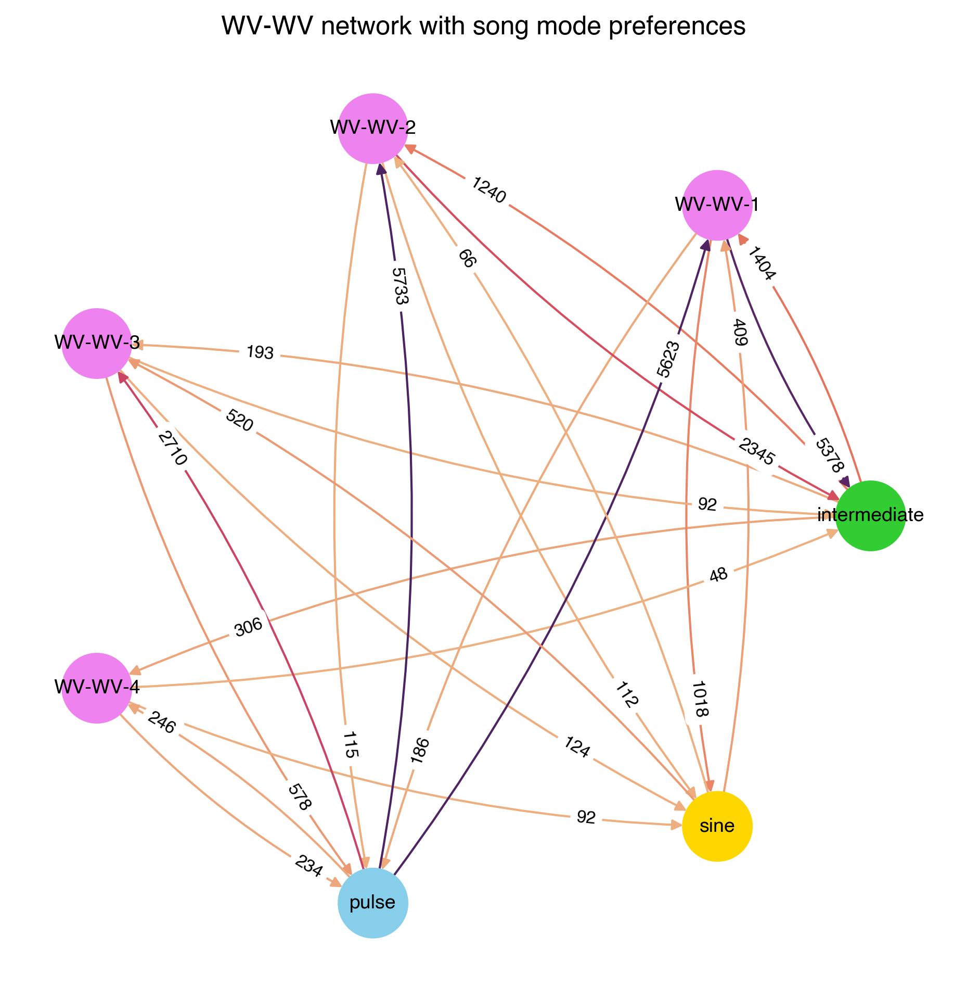

In [103]:
#build graph from above df

G3 = nx.MultiDiGraph()

for i, row in wvwv_modeprefs_network.iterrows():
    G3.add_node(row['source'], label=row['source'], color=row['source_color'])
    G3.add_node(row['target'], label=row['target'], color=row['target_color'])

for i, row in wvwv_modeprefs_network.iterrows():
    G3.add_edge(row['source'], row['target'], weight=row['weight'])

plt.figure(figsize=(6, 6))
pos = nx.circular_layout(G3)
nx.draw(G3, pos, with_labels=True,
        node_color=[data['color'] for node, data in G3.nodes(data=True)],
        node_size=1000,
        font_size=9,
        edge_cmap=seaborn.color_palette('flare', as_cmap=True),
        edge_color=[data['weight'] for u, v, data in G3.edges(data=True)],
        connectionstyle ='arc3,rad=0.1'
)
nx.draw_networkx_edge_labels(G3, pos,
                             edge_labels={(u, v): d['weight'] for u, v, d in G3.edges(data=True)},
                             font_size=8,
                             label_pos=0.8,
                             connectionstyle='arc3,rad=0.1' #yes!!! 
)

plt.title('WV-WV network with song mode preferences')

### Color coding edges by neurotransmitter type

Now that we've graphed connections between all WV-WV subtypes and inputs/outputs of different song mode preferences, what kinds of connections are happening? Are they inhibitory/excitatory?

In [104]:
#only consider GABA and ACH connections -- main inhibitory and excitatory nt in drosophila

inputs_filtered_bynts = wvwv_inputs[(wvwv_inputs['nt_type']=='GABA')|(wvwv_inputs['nt_type']=='ACH')]
inputs_filtered_bynts

,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
4618,720575940624750480,720575940635330204,203,GABA,DNg24,WV-WV-1,NaN,NaN,non-auditory,auditory
5100,720575940605214636,720575940621717469,196,GABA,WV-WV-3,WV-WV-3,NaN,NaN,auditory,auditory
5116,720575940639118926,720575940605214636,196,GABA,DNg24,WV-WV-3,NaN,NaN,non-auditory,auditory
5780,720575940644632087,720575940635330204,188,GABA,AVLP083,WV-WV-1,NaN,NaN,non-auditory,auditory
6993,720575940624750480,720575940605214636,177,GABA,DNg24,WV-WV-3,NaN,NaN,non-auditory,auditory
...,...,...,...,...,...,...,...,...,...,...
3708685,720575940623295415,720575940621717469,5,GABA,AN_multi_19,WV-WV-3,NaN,NaN,non-auditory,auditory
3709886,720575940623292713,720575940634571383,5,GABA,SAD_pr02,WV-WV-2,sine,NaN,auditory,auditory
3723221,720575940622998115,720575940622123981,5,ACH,JO-B,WV-WV-1,NaN,NaN,auditory,auditory
3726672,720575940623197588,720575940603533246,5,ACH,CB2186,WV-WV-3,NaN,NaN,non-auditory,auditory


In [105]:
#group by input song mode preference, neurotransmitter type, and WV-WV-type

wvwv_inputs_grouped_withnts = inputs_filtered_bynts.groupby(['pref_pre', 'nt_type', 'type_post'], as_index=False)[['syn_count']].sum()
wvwv_inputs_grouped_withnts

,pref_pre,nt_type,type_post,syn_count
0,intermediate,ACH,WV-WV-1,509
1,intermediate,ACH,WV-WV-2,31
2,intermediate,ACH,WV-WV-3,61
3,intermediate,ACH,WV-WV-4,5
4,intermediate,GABA,WV-WV-1,895
5,intermediate,GABA,WV-WV-2,1182
6,intermediate,GABA,WV-WV-3,98
7,intermediate,GABA,WV-WV-4,301
8,pulse,ACH,WV-WV-1,5623
9,pulse,ACH,WV-WV-2,5733


In [106]:
#get output data (everything will be GABAergic)
wvwv_outputs.groupby(['type_pre', 'nt_type', 'pref_post'], as_index=False)[['syn_count']].sum()

,type_pre,nt_type,pref_post,syn_count
0,WV-WV-1,GABA,intermediate,5378
1,WV-WV-1,GABA,pulse,186
2,WV-WV-1,GABA,sine,1018
3,WV-WV-2,GABA,intermediate,2345
4,WV-WV-2,GABA,pulse,115
5,WV-WV-2,GABA,sine,112
6,WV-WV-3,GABA,intermediate,92
7,WV-WV-3,GABA,pulse,578
8,WV-WV-3,GABA,sine,124
9,WV-WV-4,GABA,intermediate,48


In [107]:
#rename df columns before concating

wvwv_nt_inputs = wvwv_inputs_grouped_withnts.rename(columns={
    'pref_pre':'source',
    'type_post':'target'})

wvwv_nt_inputs

,source,nt_type,target,syn_count
0,intermediate,ACH,WV-WV-1,509
1,intermediate,ACH,WV-WV-2,31
2,intermediate,ACH,WV-WV-3,61
3,intermediate,ACH,WV-WV-4,5
4,intermediate,GABA,WV-WV-1,895
5,intermediate,GABA,WV-WV-2,1182
6,intermediate,GABA,WV-WV-3,98
7,intermediate,GABA,WV-WV-4,301
8,pulse,ACH,WV-WV-1,5623
9,pulse,ACH,WV-WV-2,5733


In [108]:
wvwv_nt_outputs = wvwv_nt_inputs.rename(columns={
    'type_pre':'source',
    'pref_post':'target'
})
wvwv_nt_outputs

,source,nt_type,target,syn_count
0,intermediate,ACH,WV-WV-1,509
1,intermediate,ACH,WV-WV-2,31
2,intermediate,ACH,WV-WV-3,61
3,intermediate,ACH,WV-WV-4,5
4,intermediate,GABA,WV-WV-1,895
5,intermediate,GABA,WV-WV-2,1182
6,intermediate,GABA,WV-WV-3,98
7,intermediate,GABA,WV-WV-4,301
8,pulse,ACH,WV-WV-1,5623
9,pulse,ACH,WV-WV-2,5733


In [109]:
#concatenate together

wvwv_network_withnts = pd.concat([wvwv_nt_inputs, wvwv_nt_outputs], ignore_index=True)
wvwv_network_withnts

,source,nt_type,target,syn_count
0,intermediate,ACH,WV-WV-1,509
1,intermediate,ACH,WV-WV-2,31
2,intermediate,ACH,WV-WV-3,61
3,intermediate,ACH,WV-WV-4,5
4,intermediate,GABA,WV-WV-1,895
5,intermediate,GABA,WV-WV-2,1182
6,intermediate,GABA,WV-WV-3,98
7,intermediate,GABA,WV-WV-4,301
8,pulse,ACH,WV-WV-1,5623
9,pulse,ACH,WV-WV-2,5733


In [110]:
#make two dictionaries for color coding nodes and edges
node_color_dic = {
    'WV-WV-1':'violet',
    'WV-WV-2':'violet',
    'WV-WV-3':'violet',
    'WV-WV-4':'violet',
    'pulse':'skyblue',
    'intermediate':'gold',
    'sine':'limegreen'
}

nt_color_dic = {
    'ACH': 'lightcoral',
    'GABA': 'seagreen'
}

#add color columns to df
wvwv_network_withnts['source_color'] = wvwv_network_withnts['source'].map(node_color_dic)
wvwv_network_withnts['target_color'] = wvwv_network_withnts['target'].map(node_color_dic)
wvwv_network_withnts['edge_color'] = wvwv_network_withnts['nt_type'].map(nt_color_dic)

#since intermediate preference cells express both excitatory and inhibitory nts, give them their own color so that it's distinguishable in the graph
wvwv_network_withnts.loc[wvwv_network_withnts['source'] == 'intermediate', 'edge_color'] = 'plum'
wvwv_network_withnts.loc[wvwv_network_withnts['target'] == 'intermediate', 'edge_color'] = 'plum'

wvwv_network_withnts

,source,nt_type,target,syn_count,source_color,target_color,edge_color
0,intermediate,ACH,WV-WV-1,509,gold,violet,plum
1,intermediate,ACH,WV-WV-2,31,gold,violet,plum
2,intermediate,ACH,WV-WV-3,61,gold,violet,plum
3,intermediate,ACH,WV-WV-4,5,gold,violet,plum
4,intermediate,GABA,WV-WV-1,895,gold,violet,plum
5,intermediate,GABA,WV-WV-2,1182,gold,violet,plum
6,intermediate,GABA,WV-WV-3,98,gold,violet,plum
7,intermediate,GABA,WV-WV-4,301,gold,violet,plum
8,pulse,ACH,WV-WV-1,5623,skyblue,violet,lightcoral
9,pulse,ACH,WV-WV-2,5733,skyblue,violet,lightcoral


Text(0.5, 1.0, 'WV-WV network with song mode preferences')

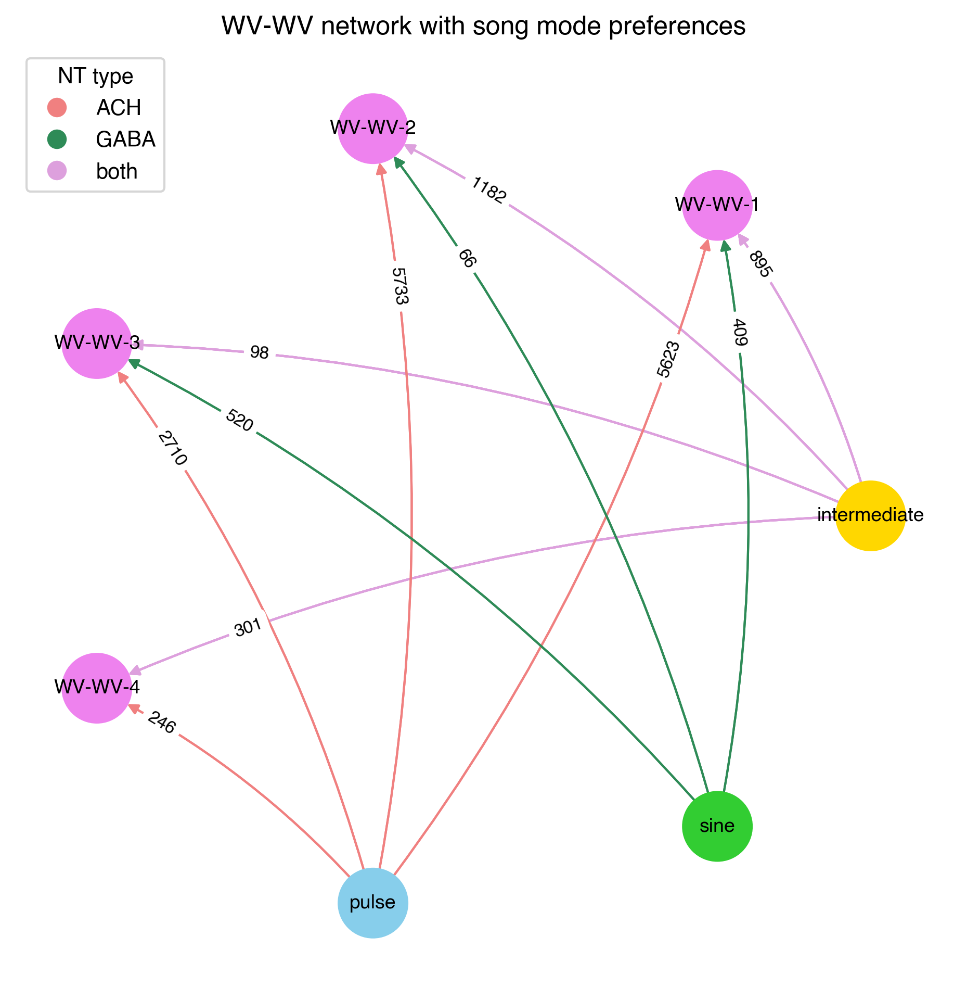

In [111]:
#graph againn

G4 = nx.MultiDiGraph()

for i, row in wvwv_network_withnts.iterrows():
    G4.add_node(row['source'], label=row['source'], color=row['source_color'])
    G4.add_node(row['target'], label=row['target'], color=row['target_color'])

for i, row in wvwv_network_withnts.iterrows():
    G4.add_edge(row['source'], row['target'], weight=row['syn_count'], edge_color=row['edge_color'])

plt.figure(figsize=(6, 6))
pos = nx.circular_layout(G4)
nx.draw(G4, pos, with_labels=True,
        node_color=[data['color'] for node, data in G4.nodes(data=True)],
        node_size=1000,
        font_size=9,
        edge_color=[data['edge_color'] for u, v, data in G4.edges(data=True)],
        connectionstyle='arc3,rad=0.1',
)

nx.draw_networkx_edge_labels(G4, pos,
                             edge_labels={(u, v): d['weight'] for u, v, d in G4.edges(data=True)},
                             font_size=8,
                             label_pos=0.8,
                             connectionstyle='arc3,rad=0.1'
)

plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='ACH', markerfacecolor='lightcoral', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='GABA', markerfacecolor='seagreen', markersize=10),
        plt.Line2D([0], [0], marker='o', color='w', label='both', markerfacecolor='plum', markersize=10)
    ],
    title="NT type",
    loc="upper left",
)

plt.title('WV-WV network with song mode preferences')


## Network graphs of cell types within each preference class

What cell types are each in mode preference class? Which WV-WVs do they connect with?

### sine-preferring

In [112]:
#find all sine-preferring input and output cells
sine_outputs = wvwv_outputs[wvwv_outputs['pref_post']=='sine']
sine_inputs = wvwv_inputs[wvwv_inputs['pref_pre']=='sine']
display(sine_outputs.head(10), sine_inputs.head(10))

,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
16147,720575940622123981,720575940631425965,130,GABA,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory
20511,720575940622123981,720575940623987982,117,GABA,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory
21556,720575940622123981,720575940629283659,114,GABA,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory
22651,720575940622123981,720575940602914988,112,GABA,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory
23842,720575940622123981,720575940634508174,109,GABA,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory
30157,720575940622123981,720575940619783518,97,GABA,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory
30314,720575940622123981,720575940622065432,97,GABA,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory
46679,720575940622123981,720575940620195719,77,GABA,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory
131153,720575940622123981,720575940620062633,46,GABA,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory
309066,720575940605214636,720575940623292713,29,GABA,WV-WV-3,SAD_pr02,NaN,sine,auditory,auditory


,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
42754,720575940621324996,720575940604201830,81,GABA,SAD_pr02,WV-WV-3,sine,NaN,auditory,auditory
52173,720575940623292713,720575940605214636,73,GABA,SAD_pr02,WV-WV-3,sine,NaN,auditory,auditory
100431,720575940617884736,720575940632945177,53,GABA,SAD_pr02,WV-WV-3,sine,NaN,auditory,auditory
122861,720575940623292713,720575940632945177,48,GABA,SAD_pr02,WV-WV-3,sine,NaN,auditory,auditory
149495,720575940615868485,720575940604201830,43,GABA,SAD_pr02,WV-WV-3,sine,NaN,auditory,auditory
154390,720575940617884736,720575940605214636,42,GABA,SAD_pr02,WV-WV-3,sine,NaN,auditory,auditory
175518,720575940617884736,720575940622123981,40,GABA,SAD_pr02,WV-WV-1,sine,NaN,auditory,auditory
180132,720575940631425965,720575940635330204,39,GABA,AVLP_pr01,WV-WV-1,sine,NaN,auditory,auditory
208180,720575940621324996,720575940605214636,36,GABA,SAD_pr02,WV-WV-3,sine,NaN,auditory,auditory
225219,720575940629283659,720575940635330204,35,GABA,AVLP_pr01,WV-WV-1,sine,NaN,auditory,auditory


In [113]:
#group by cell type and synapse count

sine_outputs_grouped = sine_outputs.groupby(['type_pre', 'type_post'], as_index=False)[['syn_count']].sum()
sine_outputs_grouped

,type_pre,type_post,syn_count
0,WV-WV-1,AVLP_pr01,965
1,WV-WV-1,AVLP_pr02,14
2,WV-WV-1,SAD_pr02,39
3,WV-WV-2,SAD_pr02,93
4,WV-WV-2,WED_pr01,19
5,WV-WV-3,SAD_pr02,124
6,WV-WV-4,SAD_pr02,82
7,WV-WV-4,WED_pr01,10


In [114]:
sine_inputs_grouped = sine_inputs.groupby(['type_pre', 'type_post'], as_index=False)[['syn_count']].sum()
sine_inputs_grouped

,type_pre,type_post,syn_count
0,AVLP_pr01,WV-WV-1,315
1,AVLP_pr01,WV-WV-2,23
2,SAD_pr02,WV-WV-1,94
3,SAD_pr02,WV-WV-2,43
4,SAD_pr02,WV-WV-3,520


In [115]:
#rename columns before concatenating

sine_outputs_grouped = sine_outputs_grouped.rename(columns={
    'type_pre':'source',
    'type_post':'target'})
sine_outputs_grouped

,source,target,syn_count
0,WV-WV-1,AVLP_pr01,965
1,WV-WV-1,AVLP_pr02,14
2,WV-WV-1,SAD_pr02,39
3,WV-WV-2,SAD_pr02,93
4,WV-WV-2,WED_pr01,19
5,WV-WV-3,SAD_pr02,124
6,WV-WV-4,SAD_pr02,82
7,WV-WV-4,WED_pr01,10


In [116]:
sine_inputs_grouped = sine_inputs_grouped.rename(columns={
    'type_pre':'source',
    'type_post':'target'})
sine_inputs_grouped

,source,target,syn_count
0,AVLP_pr01,WV-WV-1,315
1,AVLP_pr01,WV-WV-2,23
2,SAD_pr02,WV-WV-1,94
3,SAD_pr02,WV-WV-2,43
4,SAD_pr02,WV-WV-3,520


In [117]:
#concatenate together
sine_network = pd.concat([sine_outputs_grouped, sine_inputs_grouped], ignore_index=True)
sine_network

,source,target,syn_count
0,WV-WV-1,AVLP_pr01,965
1,WV-WV-1,AVLP_pr02,14
2,WV-WV-1,SAD_pr02,39
3,WV-WV-2,SAD_pr02,93
4,WV-WV-2,WED_pr01,19
5,WV-WV-3,SAD_pr02,124
6,WV-WV-4,SAD_pr02,82
7,WV-WV-4,WED_pr01,10
8,AVLP_pr01,WV-WV-1,315
9,AVLP_pr01,WV-WV-2,23


In [118]:
#add color coding

node_color_dic = {
    'WV-WV-1':'violet',
    'WV-WV-2':'violet',
    'WV-WV-3':'violet',
    'WV-WV-4':'violet',
    'AVLP_pr01':'gold',
    'AVLP_pr02':'gold',
    'GNG_pr01':'gold',
    'SAD_pr02':'gold',
    'WED_pr01':'gold'
}

sine_network['source_color'] = sine_network['source'].map(node_color_dic)
sine_network['target_color'] = sine_network['target'].map(node_color_dic)

sine_network

,source,target,syn_count,source_color,target_color
0,WV-WV-1,AVLP_pr01,965,violet,gold
1,WV-WV-1,AVLP_pr02,14,violet,gold
2,WV-WV-1,SAD_pr02,39,violet,gold
3,WV-WV-2,SAD_pr02,93,violet,gold
4,WV-WV-2,WED_pr01,19,violet,gold
5,WV-WV-3,SAD_pr02,124,violet,gold
6,WV-WV-4,SAD_pr02,82,violet,gold
7,WV-WV-4,WED_pr01,10,violet,gold
8,AVLP_pr01,WV-WV-1,315,gold,violet
9,AVLP_pr01,WV-WV-2,23,gold,violet


Text(0.5, 1.0, 'WV-WV network with sine-preferring cells')

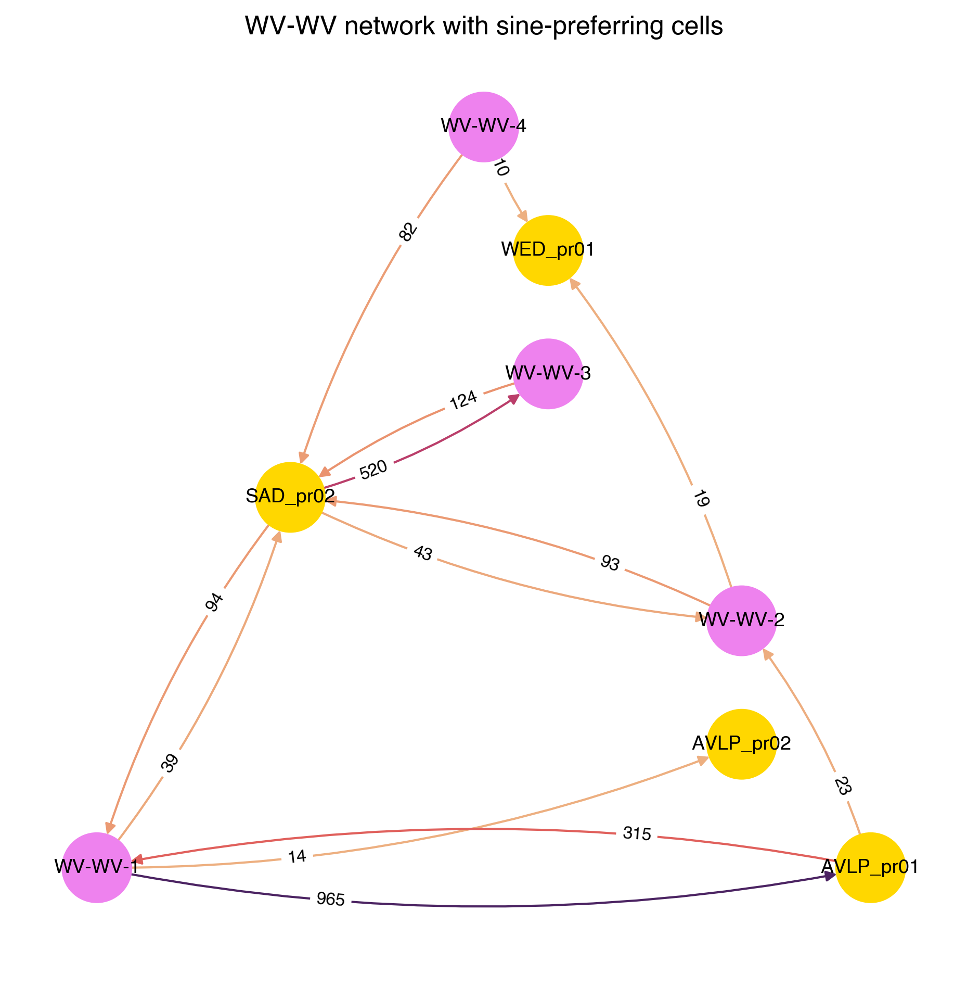

In [119]:
#graph

Gsine = nx.MultiDiGraph()

for i, row in sine_network.iterrows():
    Gsine.add_node(row['source'], label=row['source'], color=row['source_color'])
    Gsine.add_node(row['target'], label=row['target'], color=row['target_color'])

for i, row in sine_network.iterrows():
    Gsine.add_edge(row['source'], row['target'], weight=row['syn_count'])

plt.figure(figsize=(6, 6))
pos = nx.planar_layout(Gsine) #using planar this time since not everything is connected to each other
nx.draw(Gsine, pos, with_labels=True,
         node_color=[data['color'] for node, data in Gsine.nodes(data=True)],
         node_size=1000,
         font_size=9,
         edge_cmap=seaborn.color_palette('flare', as_cmap=True),
         edge_color=[data['weight'] for u, v, data in Gsine.edges(data=True)],
         connectionstyle='arc3,rad=0.1'
)

nx.draw_networkx_edge_labels(Gsine, pos,
                             edge_labels={(u, v): d['weight'] for u, v, d in Gsine.edges(data=True)},
                             font_size=8,
                             label_pos=0.3,
                             connectionstyle='arc3,rad=0.1'
)

plt.title('WV-WV network with sine-preferring cells')

### pulse-preferring

In [120]:
pulse_inputs = wvwv_inputs[wvwv_inputs['pref_pre']=='pulse']
pulse_inputs

,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
10357,720575940622254375,720575940623322877,154,ACH,B1,WV-WV-1,pulse,NaN,auditory,auditory
10924,720575940627263375,720575940632945177,151,ACH,B1,WV-WV-3,pulse,NaN,auditory,auditory
11707,720575940622097959,720575940623322877,147,ACH,B1,WV-WV-1,pulse,NaN,auditory,auditory
12090,720575940607188036,720575940623322877,145,ACH,B1,WV-WV-1,pulse,NaN,auditory,auditory
12863,720575940604839200,720575940635330204,142,ACH,B1,WV-WV-1,pulse,NaN,auditory,auditory
...,...,...,...,...,...,...,...,...,...,...
3601233,720575940620758221,720575940609513841,5,ACH,B1,WV-WV-4,pulse,NaN,auditory,auditory
3602264,720575940620980323,720575940625345328,5,ACH,B1,WV-WV-2,pulse,NaN,auditory,auditory
3651898,720575940632829507,720575940632945177,5,ACH,B1,WV-WV-3,pulse,NaN,auditory,auditory
3662429,720575940624872179,720575940621148660,5,ACH,B1,WV-WV-2,pulse,NaN,auditory,auditory


In [121]:
pulse_outputs = wvwv_outputs[wvwv_outputs['pref_post']=='pulse']
pulse_outputs

,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
43825,720575940641545888,720575940638214461,80,GABA,WV-WV-4,A2,NaN,pulse,auditory,auditory
46324,720575940641545888,720575940632649697,78,GABA,WV-WV-4,A2,NaN,pulse,auditory,auditory
89320,720575940605214636,720575940618599277,56,GABA,WV-WV-3,B1,NaN,pulse,auditory,auditory
162533,720575940605214636,720575940614310802,41,GABA,WV-WV-3,B1,NaN,pulse,auditory,auditory
216593,720575940605214636,720575940617431325,35,GABA,WV-WV-3,B1,NaN,pulse,auditory,auditory
...,...,...,...,...,...,...,...,...,...,...
3519755,720575940635330204,720575940630603091,5,GABA,WV-WV-1,B1,NaN,pulse,auditory,auditory
3529503,720575940621148660,720575940611864243,5,GABA,WV-WV-2,B1,NaN,pulse,auditory,auditory
3529533,720575940621148660,720575940603636913,5,GABA,WV-WV-2,B1,NaN,pulse,auditory,auditory
3671314,720575940632945177,720575940620980323,5,GABA,WV-WV-3,B1,NaN,pulse,auditory,auditory


In [122]:
pulse_inputs_grouped = pulse_inputs.groupby(['type_pre', 'type_post'], as_index=False)[['syn_count']].sum().rename(columns={
    'type_pre':'source',
    'type_post':'target'
})
pulse_inputs_grouped

,source,target,syn_count
0,A2,WV-WV-1,29
1,A2,WV-WV-2,132
2,A2,WV-WV-3,41
3,A2,WV-WV-4,164
4,B1,WV-WV-1,5594
5,B1,WV-WV-2,5601
6,B1,WV-WV-3,2669
7,B1,WV-WV-4,82


In [123]:
pulse_outputs_grouped = pulse_outputs.groupby(['type_pre', 'type_post'], as_index=False)[['syn_count']].sum().rename(columns={
    'type_pre':'source',
    'type_post':'target'
})
pulse_outputs_grouped

,source,target,syn_count
0,WV-WV-1,A2,5
1,WV-WV-1,AVLP/PVLP_pr01,18
2,WV-WV-1,B1,157
3,WV-WV-1,IPS_pr01,6
4,WV-WV-2,A2,7
5,WV-WV-2,B1,108
6,WV-WV-3,A2,64
7,WV-WV-3,AVLP/PVLP_pr01,14
8,WV-WV-3,B1,468
9,WV-WV-3,IPS_pr01,32


In [124]:
pulse_network = pd.concat(
    [pulse_inputs_grouped,
    pulse_outputs_grouped]
)
pulse_network

,source,target,syn_count
0,A2,WV-WV-1,29
1,A2,WV-WV-2,132
2,A2,WV-WV-3,41
3,A2,WV-WV-4,164
4,B1,WV-WV-1,5594
5,B1,WV-WV-2,5601
6,B1,WV-WV-3,2669
7,B1,WV-WV-4,82
0,WV-WV-1,A2,5
1,WV-WV-1,AVLP/PVLP_pr01,18


In [125]:
#add dictionary column...

node_color_dic = {
    'WV-WV-1':'violet',
    'WV-WV-2':'violet',
    'WV-WV-3':'violet',
    'WV-WV-4':'violet',
    'A2':'skyblue',
    'B1':'skyblue',
    'IPS_pr01':'skyblue',
    'AVLP/PVLP_pr01':'skyblue'
}

pulse_network['source_color'] = pulse_network['source'].map(node_color_dic)
pulse_network['target_color'] = pulse_network['target'].map(node_color_dic)

pulse_network

,source,target,syn_count,source_color,target_color
0,A2,WV-WV-1,29,skyblue,violet
1,A2,WV-WV-2,132,skyblue,violet
2,A2,WV-WV-3,41,skyblue,violet
3,A2,WV-WV-4,164,skyblue,violet
4,B1,WV-WV-1,5594,skyblue,violet
5,B1,WV-WV-2,5601,skyblue,violet
6,B1,WV-WV-3,2669,skyblue,violet
7,B1,WV-WV-4,82,skyblue,violet
0,WV-WV-1,A2,5,violet,skyblue
1,WV-WV-1,AVLP/PVLP_pr01,18,violet,skyblue


Text(0.5, 1.0, 'WV-WV network with pulse-preferring cells')

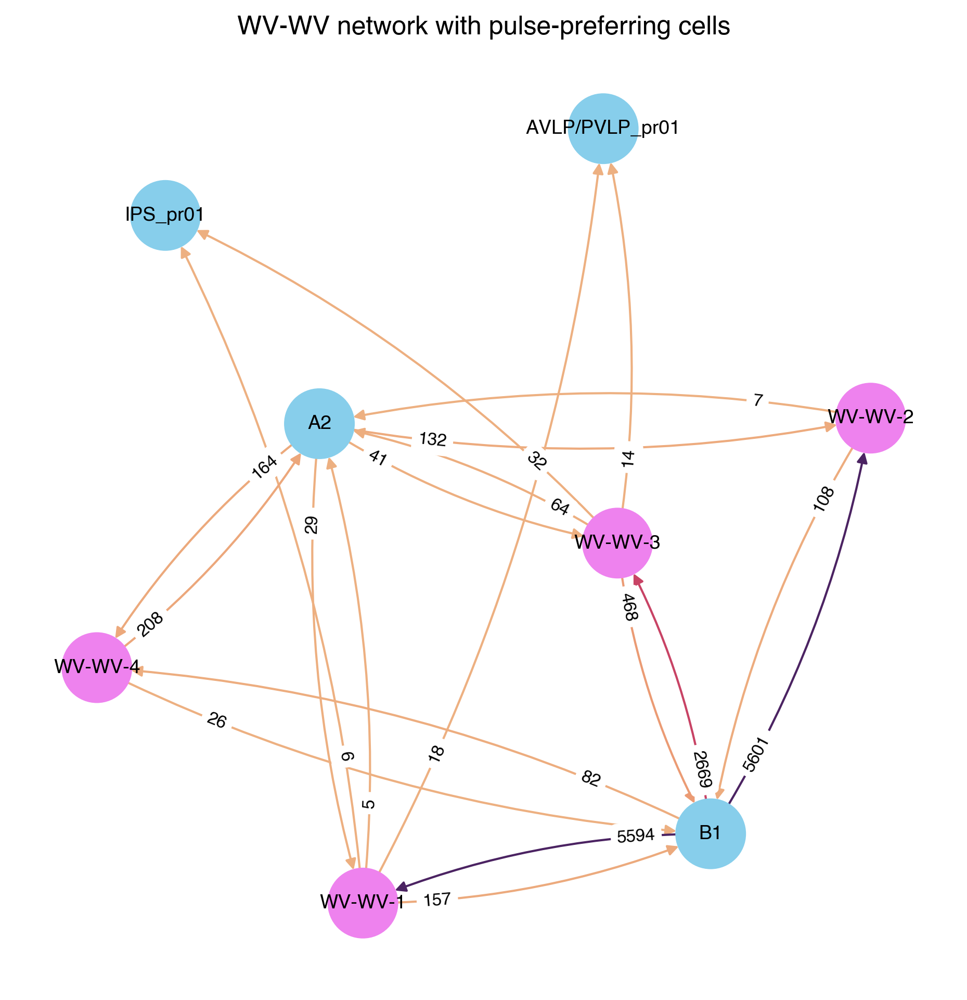

In [126]:
#graph

Gpulse = nx.MultiDiGraph()

for i, row in pulse_network.iterrows():
    Gpulse.add_node(row['source'], label=row['source'], color=row['source_color'])
    Gpulse.add_node(row['target'], label=row['target'], color=row['target_color'])

for i, row in pulse_network.iterrows():
    Gpulse.add_edge(row['source'], row['target'], weight=row['syn_count'])

plt.figure(figsize=(6, 6))
pos = nx.arf_layout(Gpulse, seed=17) #using planar this time since not everything is connected to each other
nx.draw(Gpulse, pos, with_labels=True,
         node_color=[data['color'] for node, data in Gpulse.nodes(data=True)],
         node_size=1000,
         font_size=9,
         edge_cmap=seaborn.color_palette('flare', as_cmap=True),
         edge_color=[data['weight'] for u, v, data in Gpulse.edges(data=True)],
         connectionstyle='arc3,rad=0.1'
)

nx.draw_networkx_edge_labels(Gpulse, pos,
                             edge_labels={(u, v): d['weight'] for u, v, d in Gpulse.edges(data=True)},
                             font_size=8,
                             label_pos=0.2,
                             connectionstyle='arc3,rad=0.1'
)

plt.title('WV-WV network with pulse-preferring cells')

### intermediate preference

In [128]:
med_inputs = wvwv_inputs[wvwv_inputs['pref_pre']=='intermediate']
med_outputs = wvwv_outputs[wvwv_outputs['pref_post']=='intermediate']

display(med_inputs, med_outputs)

,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
66708,720575940630258003,720575940623322877,64,GABA,WED_pr02,WV-WV-1,intermediate,NaN,auditory,auditory
82360,720575940630744019,720575940623322877,58,ACH,WED-VLP,WV-WV-1,intermediate,NaN,auditory,auditory
100220,720575940634126478,720575940623322877,53,ACH,WED-VLP,WV-WV-1,intermediate,NaN,auditory,auditory
111375,720575940625887631,720575940620835327,50,GABA,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory
112383,720575940632649567,720575940623322877,50,ACH,WED-VLP,WV-WV-1,intermediate,NaN,auditory,auditory
...,...,...,...,...,...,...,...,...,...,...
3564964,720575940621835246,720575940634571383,5,GABA,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory
3583562,720575940619785566,720575940622123981,5,ACH,WED-VLP,WV-WV-1,intermediate,NaN,auditory,auditory
3597368,720575940635981742,720575940620835327,5,GABA,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory
3597405,720575940635981742,720575940605095346,5,GABA,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory


,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
4577,720575940623322877,720575940630258003,203,GABA,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory
11583,720575940623322877,720575940628267264,148,GABA,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory
15866,720575940623322877,720575940621540586,131,GABA,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory
16893,720575940623322877,720575940640507763,127,GABA,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory
19247,720575940623322877,720575940635981742,120,GABA,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory
...,...,...,...,...,...,...,...,...,...,...
3519915,720575940635330204,720575940621835246,5,GABA,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory
3519931,720575940635330204,720575940623547685,5,GABA,WV-WV-1,WED-VLP,NaN,intermediate,auditory,auditory
3529483,720575940621148660,720575940631153194,5,GABA,WV-WV-2,AVLP_pr23,NaN,intermediate,auditory,auditory
3529535,720575940621148660,720575940603331686,5,GABA,WV-WV-2,AVLP_pr05,NaN,intermediate,auditory,auditory


In [129]:
med_inputs_grouped = med_inputs.groupby(['type_pre', 'type_post'], as_index=False)[['syn_count']].sum().rename(columns={
    'type_pre':'source',
    'type_post':'target'
})
med_inputs_grouped

,source,target,syn_count
0,AVLP_pr23,WV-WV-1,13
1,AVLP_pr23,WV-WV-2,31
2,AVLP_pr23,WV-WV-3,56
3,B2,WV-WV-2,27
4,B2,WV-WV-3,85
5,WED-VLP,WV-WV-1,496
6,WED-VLP,WV-WV-3,5
7,WED-VLP,WV-WV-4,5
8,WED_pr02,WV-WV-1,895
9,WED_pr02,WV-WV-2,1182


In [130]:
med_outputs_grouped = med_outputs.groupby(['type_pre', 'type_post'], as_index=False)[['syn_count']].sum().rename(columns={
    'type_pre':'source',
    'type_post':'target'
})
med_outputs_grouped

,source,target,syn_count
0,WV-WV-1,AVLP_pr23,178
1,WV-WV-1,WED-VLP,3189
2,WV-WV-1,WED_pr02,2011
3,WV-WV-2,AVLP_pr05,23
4,WV-WV-2,AVLP_pr23,10
5,WV-WV-2,WED-VLP,69
6,WV-WV-2,WED_pr02,2243
7,WV-WV-3,AVLP/PVLP,44
8,WV-WV-3,AVLP_pr23,43
9,WV-WV-3,WED_pr02,5


In [131]:
med_network = pd.concat([med_inputs_grouped, med_outputs_grouped])
med_network

,source,target,syn_count
0,AVLP_pr23,WV-WV-1,13
1,AVLP_pr23,WV-WV-2,31
2,AVLP_pr23,WV-WV-3,56
3,B2,WV-WV-2,27
4,B2,WV-WV-3,85
5,WED-VLP,WV-WV-1,496
6,WED-VLP,WV-WV-3,5
7,WED-VLP,WV-WV-4,5
8,WED_pr02,WV-WV-1,895
9,WED_pr02,WV-WV-2,1182


In [132]:
#color code again

node_color_dic = {
    'WV-WV-1':'violet',
    'WV-WV-2':'violet',
    'WV-WV-3':'violet',
    'WV-WV-4':'violet',
    'AVLP_pr23':'limegreen',
    'B2':'limegreen',
    'WED-VLP':'limegreen',
    'WED_pr02':'limegreen',
    'AVLP/PVLP':'limegreen',
    'AVLP_pr05':'limegreen'
}

med_network['source_color'] = med_network['source'].map(node_color_dic)
med_network['target_color'] = med_network['target'].map(node_color_dic)

med_network

,source,target,syn_count,source_color,target_color
0,AVLP_pr23,WV-WV-1,13,limegreen,violet
1,AVLP_pr23,WV-WV-2,31,limegreen,violet
2,AVLP_pr23,WV-WV-3,56,limegreen,violet
3,B2,WV-WV-2,27,limegreen,violet
4,B2,WV-WV-3,85,limegreen,violet
5,WED-VLP,WV-WV-1,496,limegreen,violet
6,WED-VLP,WV-WV-3,5,limegreen,violet
7,WED-VLP,WV-WV-4,5,limegreen,violet
8,WED_pr02,WV-WV-1,895,limegreen,violet
9,WED_pr02,WV-WV-2,1182,limegreen,violet


Text(0.5, 1.0, 'WV-WV network with intermediate-preference cells')

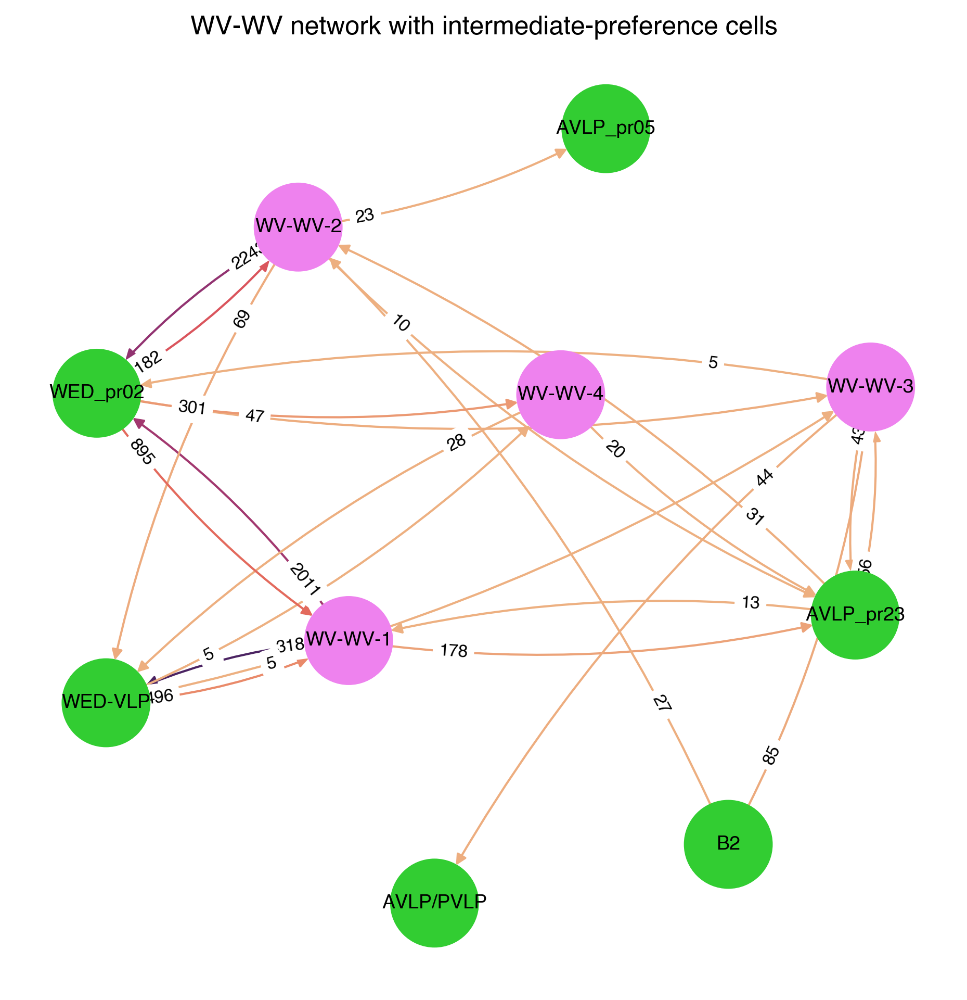

In [133]:
#graph

Gmed = nx.MultiDiGraph()

for i, row in med_network.iterrows():
    Gmed.add_node(row['source'], label=row['source'], color=row['source_color'])
    Gmed.add_node(row['target'], label=row['target'], color=row['target_color'])

for i, row in med_network.iterrows():
    Gmed.add_edge(row['source'], row['target'], weight=row['syn_count'])

plt.figure(figsize=(6, 6))
pos = nx.arf_layout(Gmed, seed=120) #using planar this time since not everything is connected to each other
nx.draw(Gmed, pos, with_labels=True,
         node_color=[data['color'] for node, data in Gmed.nodes(data=True)],
         node_size=1600,
         font_size=9,
         edge_cmap=seaborn.color_palette('flare', as_cmap=True),
         edge_color=[data['weight'] for u, v, data in Gmed.edges(data=True)],
         connectionstyle='arc3,rad=0.1'
)

nx.draw_networkx_edge_labels(Gmed, pos,
                             edge_labels={(u, v): d['weight'] for u, v, d in Gmed.edges(data=True)},
                             font_size=8,
                             label_pos=0.2,
                             connectionstyle='arc3,rad=0.1'
)

plt.title('WV-WV network with intermediate-preference cells')

## comprehensive graph

In [134]:
#drop all nan values for non-wvwv cells
modepref_outputs = wvwv_outputs.dropna(subset=['pref_post'])
modepref_outputs

,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
4577,720575940623322877,720575940630258003,203,GABA,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory
11583,720575940623322877,720575940628267264,148,GABA,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory
15866,720575940623322877,720575940621540586,131,GABA,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory
16147,720575940622123981,720575940631425965,130,GABA,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory
16893,720575940623322877,720575940640507763,127,GABA,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory
...,...,...,...,...,...,...,...,...,...,...
3671314,720575940632945177,720575940620980323,5,GABA,WV-WV-3,B1,NaN,pulse,auditory,auditory
3699238,720575940634571383,720575940624314468,5,GABA,WV-WV-2,WED_pr01,NaN,sine,auditory,auditory
3699399,720575940634571383,720575940608432760,5,GABA,WV-WV-2,SAD_pr02,NaN,sine,auditory,auditory
3711079,720575940623322877,720575940627642818,5,GABA,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory


In [137]:
modepref_inputs = wvwv_inputs.dropna(subset=['pref_pre'])
modepref_inputs

,pre_root_id,post_root_id,syn_count,nt_type,type_pre,type_post,pref_pre,pref_post,class_pre,class_post
10357,720575940622254375,720575940623322877,154,ACH,B1,WV-WV-1,pulse,NaN,auditory,auditory
10924,720575940627263375,720575940632945177,151,ACH,B1,WV-WV-3,pulse,NaN,auditory,auditory
11707,720575940622097959,720575940623322877,147,ACH,B1,WV-WV-1,pulse,NaN,auditory,auditory
12090,720575940607188036,720575940623322877,145,ACH,B1,WV-WV-1,pulse,NaN,auditory,auditory
12863,720575940604839200,720575940635330204,142,ACH,B1,WV-WV-1,pulse,NaN,auditory,auditory
...,...,...,...,...,...,...,...,...,...,...
3651898,720575940632829507,720575940632945177,5,ACH,B1,WV-WV-3,pulse,NaN,auditory,auditory
3662429,720575940624872179,720575940621148660,5,ACH,B1,WV-WV-2,pulse,NaN,auditory,auditory
3666233,720575940633044634,720575940620835327,5,GABA,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory
3699630,720575940622577336,720575940620835327,5,ACH,B1,WV-WV-2,pulse,NaN,auditory,auditory


In [138]:
modepref_outputs_grouped = modepref_outputs.groupby(['type_pre', 'type_post', 'pref_post'], as_index=False)[['syn_count']].sum()
modepref_outputs_grouped

,type_pre,type_post,pref_post,syn_count
0,WV-WV-1,A2,pulse,5
1,WV-WV-1,AVLP/PVLP_pr01,pulse,18
2,WV-WV-1,AVLP_pr01,sine,965
3,WV-WV-1,AVLP_pr02,sine,14
4,WV-WV-1,AVLP_pr23,intermediate,178
5,WV-WV-1,B1,pulse,157
6,WV-WV-1,IPS_pr01,pulse,6
7,WV-WV-1,SAD_pr02,sine,39
8,WV-WV-1,WED-VLP,intermediate,3189
9,WV-WV-1,WED_pr02,intermediate,2011


In [139]:
modepref_inputs_grouped = modepref_inputs.groupby(['type_pre', 'type_post', 'pref_pre'], as_index=False)[['syn_count']].sum()
modepref_inputs_grouped

,type_pre,type_post,pref_pre,syn_count
0,A2,WV-WV-1,pulse,29
1,A2,WV-WV-2,pulse,132
2,A2,WV-WV-3,pulse,41
3,A2,WV-WV-4,pulse,164
4,AVLP_pr01,WV-WV-1,sine,315
5,AVLP_pr01,WV-WV-2,sine,23
6,AVLP_pr23,WV-WV-1,intermediate,13
7,AVLP_pr23,WV-WV-2,intermediate,31
8,AVLP_pr23,WV-WV-3,intermediate,56
9,B1,WV-WV-1,pulse,5594


In [140]:
#rename and then concat

modepref_outputs_relabeled = modepref_outputs_grouped.rename(columns={
    'type_pre':'source',
    'type_post':'target',
    'pref_post':'pref'
})[['source', 'target', 'syn_count', 'pref']]
modepref_outputs_relabeled

,source,target,syn_count,pref
0,WV-WV-1,A2,5,pulse
1,WV-WV-1,AVLP/PVLP_pr01,18,pulse
2,WV-WV-1,AVLP_pr01,965,sine
3,WV-WV-1,AVLP_pr02,14,sine
4,WV-WV-1,AVLP_pr23,178,intermediate
5,WV-WV-1,B1,157,pulse
6,WV-WV-1,IPS_pr01,6,pulse
7,WV-WV-1,SAD_pr02,39,sine
8,WV-WV-1,WED-VLP,3189,intermediate
9,WV-WV-1,WED_pr02,2011,intermediate


In [141]:
#make color dic and add to df

wvwv_prefcell_conns_colordic = {
    'WV-WV-1':'violet',
    'WV-WV-2':'violet',
    'WV-WV-3':'violet',
    'WV-WV-4':'violet',
    'pulse':'skyblue',
    'sine':'gold',
    'intermediate':'limegreen'
}

In [142]:
#add dictionary before concatenating

modepref_outputs_relabeled['source_color'] = modepref_outputs_relabeled['source'].map(wvwv_prefcell_conns_colordic)
modepref_outputs_relabeled['target_color'] = modepref_outputs_relabeled['pref'].map(wvwv_prefcell_conns_colordic)
modepref_outputs_relabeled

,source,target,syn_count,pref,source_color,target_color
0,WV-WV-1,A2,5,pulse,violet,skyblue
1,WV-WV-1,AVLP/PVLP_pr01,18,pulse,violet,skyblue
2,WV-WV-1,AVLP_pr01,965,sine,violet,gold
3,WV-WV-1,AVLP_pr02,14,sine,violet,gold
4,WV-WV-1,AVLP_pr23,178,intermediate,violet,limegreen
5,WV-WV-1,B1,157,pulse,violet,skyblue
6,WV-WV-1,IPS_pr01,6,pulse,violet,skyblue
7,WV-WV-1,SAD_pr02,39,sine,violet,gold
8,WV-WV-1,WED-VLP,3189,intermediate,violet,limegreen
9,WV-WV-1,WED_pr02,2011,intermediate,violet,limegreen


In [143]:
modepref_inputs_relabeled = modepref_inputs_grouped.rename(columns={
    'type_pre':'source',
    'type_post':'target',
    'pref_pre':'pref'
})[['source', 'target', 'syn_count', 'pref']]
modepref_inputs_relabeled

,source,target,syn_count,pref
0,A2,WV-WV-1,29,pulse
1,A2,WV-WV-2,132,pulse
2,A2,WV-WV-3,41,pulse
3,A2,WV-WV-4,164,pulse
4,AVLP_pr01,WV-WV-1,315,sine
5,AVLP_pr01,WV-WV-2,23,sine
6,AVLP_pr23,WV-WV-1,13,intermediate
7,AVLP_pr23,WV-WV-2,31,intermediate
8,AVLP_pr23,WV-WV-3,56,intermediate
9,B1,WV-WV-1,5594,pulse


In [144]:
#add colormap
modepref_inputs_relabeled['source_color'] = modepref_inputs_relabeled['pref'].map(wvwv_prefcell_conns_colordic)
modepref_inputs_relabeled['target_color'] = modepref_inputs_relabeled['target'].map(wvwv_prefcell_conns_colordic)
modepref_inputs_relabeled

,source,target,syn_count,pref,source_color,target_color
0,A2,WV-WV-1,29,pulse,skyblue,violet
1,A2,WV-WV-2,132,pulse,skyblue,violet
2,A2,WV-WV-3,41,pulse,skyblue,violet
3,A2,WV-WV-4,164,pulse,skyblue,violet
4,AVLP_pr01,WV-WV-1,315,sine,gold,violet
5,AVLP_pr01,WV-WV-2,23,sine,gold,violet
6,AVLP_pr23,WV-WV-1,13,intermediate,limegreen,violet
7,AVLP_pr23,WV-WV-2,31,intermediate,limegreen,violet
8,AVLP_pr23,WV-WV-3,56,intermediate,limegreen,violet
9,B1,WV-WV-1,5594,pulse,skyblue,violet


In [145]:
wvwv_prefcelltypes_network = pd.concat([modepref_inputs_relabeled, modepref_outputs_relabeled], ignore_index=True)
wvwv_prefcelltypes_network

,source,target,syn_count,pref,source_color,target_color
0,A2,WV-WV-1,29,pulse,skyblue,violet
1,A2,WV-WV-2,132,pulse,skyblue,violet
2,A2,WV-WV-3,41,pulse,skyblue,violet
3,A2,WV-WV-4,164,pulse,skyblue,violet
4,AVLP_pr01,WV-WV-1,315,sine,gold,violet
5,AVLP_pr01,WV-WV-2,23,sine,gold,violet
6,AVLP_pr23,WV-WV-1,13,intermediate,limegreen,violet
7,AVLP_pr23,WV-WV-2,31,intermediate,limegreen,violet
8,AVLP_pr23,WV-WV-3,56,intermediate,limegreen,violet
9,B1,WV-WV-1,5594,pulse,skyblue,violet


In [146]:
#graph

G5 = nx.MultiDiGraph()

for i, row in wvwv_prefcelltypes_network.iterrows():
    G5.add_node(row['source'], label=row['source'], color=row['source_color'])
    G5.add_node(row['target'], label=row['target'], color=row['target_color'])

for i, row in wvwv_prefcelltypes_network.iterrows():
    G5.add_edge(row['source'], row['target'], weight=row['syn_count'])

plt.figure(figsize=(50, 50))

pos = nx.arf_layout(G5, a=2, scaling=2, seed=11)

for i, n in enumerate(G5.nodes): #because I want a more specific layout, I am specifying the position of every single node in this graph
    if n == 'WV-WV-1':
        pos[n][0] = -5
        pos[n][1] = 0
    elif n == 'WV-WV-2':
        pos[n][0] = -2
        pos[n][1] = -2
    elif n == 'WV-WV-3':
        pos[n][0] = -1
        pos[n][1] = 0
    elif n == 'WV-WV-4':
        pos[n][0] = 2
        pos[n][1] = -2
    elif n == 'B1': #pulse
        pos[n][0] = -4
        pos[n][1] = 4
    elif n == 'AVLP/PVLP_pr01': #pulse
        pos[n][0] = -8
        pos[n][1] = 2
    elif n == 'A2': #pulse
        pos[n][0] = 1
        pos[n][1] = 4
    elif n == 'IPS_pr01': #pulse
        pos[n][0] = 3
        pos[n][1] = 2
    elif n == 'AVLP_pr02': #sine
        pos[n][0] = -8
        pos[n][1] = 1
    elif n == 'WED_pr01': #sine
        pos[n][0] = -8
        pos[n][1] = -2
    elif n == 'SAD_pr02': #sine
        pos[n][0] = -7
        pos[n][1] = -5
    elif n == 'AVLP_pr01': #sine
        pos[n][0] = -10
        pos[n][1] = 0
    elif n == 'GNG_pr01': #sine
        pos[n][0] = -8
        pos[n][1] = -1
    elif n == 'AVLP_pr05': #intermediate
        pos[n][0] = 4
        pos[n][1] = -3
    elif n == 'AVLP/PVLP': #intermediate
        pos[n][0] = 4
        pos[n][1] = 0
    elif n == 'AVLP_pr23': #intermediate
        pos[n][0] = 6
        pos[n][1] = 1
    elif n == 'WED-VLP': #intermediate
        pos[n][0] = -2
        pos[n][1] = -6
    elif n == 'WED_pr02': #intermediate
        pos[n][0] = 4
        pos[n][1] = -5
    elif n == 'B2': #intermediate
        pos[n][0] = 5
        pos[n][1] = -2
    

nx.draw(G5, pos, with_labels=True,
        node_color=[data['color'] for node, data in G5.nodes(data=True)],
        node_size=40000,
        font_size=40,
        edge_cmap=seaborn.color_palette('flare', as_cmap=True),
        edge_color=[data['weight'] for u, v, data in G5.edges(data=True)],
        arrowsize=30,
        width=5,
        connectionstyle='arc3, rad=0.1',
)

nx.draw_networkx_edge_labels(G5, pos,
                             edge_labels={(u, v): d['weight'] for u, v, d in G5.edges(data=True)},
                             font_size=40,
                             label_pos=0.2,
                             connectionstyle='arc3, rad=0.1',
)

plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='sine', markerfacecolor='gold', markersize=70),
        plt.Line2D([0], [0], marker='o', color='w', label='pulse', markerfacecolor='skyblue', markersize=70),
        plt.Line2D([0], [0], marker='o', color='w', label='intermediate', markerfacecolor='limegreen', markersize=70)  
    ],
    title="Song mode preference",
    title_fontsize=70,
    loc="upper left",
    fontsize=70
)

plt.title('WV-WV network between cell types with known mode preferences', fontsize=80)

Text(0.5, 1.0, 'WV-WV network between cell types with known mode preferences')

## Inputs and outputs without song mode preference filter

Next step: make a network graph of the top inputs and outputs (of all WV-WVs as a group) regardless of song mode preference.

In [147]:
#find top 10 outputs
wvwv_t10_outputs = wvwv_outputs.groupby(['type_pre', 'type_post', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by=('syn_count'), ascending=False).head(10)
wvwv_t10_outputs

,type_pre,type_post,pref_pre,pref_post,class_pre,class_post,syn_count
164,WV-WV-1,WED-VLP,NaN,intermediate,auditory,auditory,3189
322,WV-WV-2,WED_pr02,NaN,intermediate,auditory,auditory,2243
179,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory,2011
328,WV-WV-3,AMMC-A1,NaN,NaN,auditory,auditory,1381
414,WV-WV-3,DNp01,NaN,NaN,auditory,auditory,1372
415,WV-WV-3,DNp02,NaN,NaN,auditory,non-auditory,1136
241,WV-WV-2,CB1760,NaN,NaN,auditory,non-auditory,1101
244,WV-WV-2,CB1948,NaN,NaN,auditory,non-auditory,1044
31,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory,965
445,WV-WV-3,WV-WV-3,NaN,NaN,auditory,auditory,931


In [148]:
#find top 10 inputs
wvwv_t10_inputs = wvwv_inputs.groupby(['type_pre', 'type_post', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by=('syn_count'), ascending=False).head(10)
wvwv_t10_inputs

,type_pre,type_post,pref_pre,pref_post,class_pre,class_post,syn_count
113,B1,WV-WV-2,pulse,NaN,auditory,auditory,5601
112,B1,WV-WV-1,pulse,NaN,auditory,auditory,5594
347,JO-A,WV-WV-3,NaN,NaN,auditory,auditory,3485
345,JO-A,WV-WV-1,NaN,NaN,auditory,auditory,2990
114,B1,WV-WV-3,pulse,NaN,auditory,auditory,2669
423,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory,1182
301,DNg40,WV-WV-3,NaN,NaN,non-auditory,auditory,1130
435,WV-WV-3,WV-WV-3,NaN,NaN,auditory,auditory,931
422,WED_pr02,WV-WV-1,intermediate,NaN,auditory,auditory,895
223,CB1948,WV-WV-3,NaN,NaN,non-auditory,auditory,854


In [149]:
#concatenate
wvwv_t10_conns = pd.concat([wvwv_t10_inputs, wvwv_t10_outputs], ignore_index=True)
wvwv_t10_conns

,type_pre,type_post,pref_pre,pref_post,class_pre,class_post,syn_count
0,B1,WV-WV-2,pulse,NaN,auditory,auditory,5601
1,B1,WV-WV-1,pulse,NaN,auditory,auditory,5594
2,JO-A,WV-WV-3,NaN,NaN,auditory,auditory,3485
3,JO-A,WV-WV-1,NaN,NaN,auditory,auditory,2990
4,B1,WV-WV-3,pulse,NaN,auditory,auditory,2669
5,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory,1182
6,DNg40,WV-WV-3,NaN,NaN,non-auditory,auditory,1130
7,WV-WV-3,WV-WV-3,NaN,NaN,auditory,auditory,931
8,WED_pr02,WV-WV-1,intermediate,NaN,auditory,auditory,895
9,CB1948,WV-WV-3,NaN,NaN,non-auditory,auditory,854


In [150]:
#rename
wvwv_t10_conns_network = wvwv_t10_conns.rename(columns={
    'type_pre':'source',
    'type_post':'target',
    'pref_pre':'input_pref',
    'pref_post':'output_pref',
})
wvwv_t10_conns_network

,source,target,input_pref,output_pref,class_pre,class_post,syn_count
0,B1,WV-WV-2,pulse,NaN,auditory,auditory,5601
1,B1,WV-WV-1,pulse,NaN,auditory,auditory,5594
2,JO-A,WV-WV-3,NaN,NaN,auditory,auditory,3485
3,JO-A,WV-WV-1,NaN,NaN,auditory,auditory,2990
4,B1,WV-WV-3,pulse,NaN,auditory,auditory,2669
5,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory,1182
6,DNg40,WV-WV-3,NaN,NaN,non-auditory,auditory,1130
7,WV-WV-3,WV-WV-3,NaN,NaN,auditory,auditory,931
8,WED_pr02,WV-WV-1,intermediate,NaN,auditory,auditory,895
9,CB1948,WV-WV-3,NaN,NaN,non-auditory,auditory,854


In [151]:
#additional color coding
#color code remaining nan values according to class
wvwv_t10_conns_network.loc[wvwv_t10_conns_network['class_pre']=='auditory', 'source_color'] = 'mediumpurple'
wvwv_t10_conns_network.loc[wvwv_t10_conns_network['class_post']=='auditory', 'target_color'] = 'mediumpurple'
wvwv_t10_conns_network.loc[wvwv_t10_conns_network['class_pre']=='non-auditory', 'source_color'] = 'grey'
wvwv_t10_conns_network.loc[wvwv_t10_conns_network['class_post']=='non-auditory', 'target_color'] = 'grey'
wvwv_t10_conns_network.loc[wvwv_t10_conns_network['input_pref']=='pulse', 'source_color'] = 'skyblue'
wvwv_t10_conns_network.loc[wvwv_t10_conns_network['output_pref']=='pulse', 'target_color'] = 'skyblue'
wvwv_t10_conns_network.loc[wvwv_t10_conns_network['input_pref']=='intermediate', 'source_color'] = 'limegreen'
wvwv_t10_conns_network.loc[wvwv_t10_conns_network['output_pref']=='intermediate', 'target_color'] = 'limegreen'

#make sure all wv-wvs are violet

wvwv_t10_conns_network.loc[wvwv_t10_conns_network['source'].str.contains('WV-WV'), 'source_color'] = 'violet'
wvwv_t10_conns_network.loc[wvwv_t10_conns_network['target'].str.contains('WV-WV'), 'target_color'] = 'violet'


wvwv_t10_conns_network


,source,target,input_pref,output_pref,class_pre,class_post,syn_count,source_color,target_color
0,B1,WV-WV-2,pulse,NaN,auditory,auditory,5601,skyblue,violet
1,B1,WV-WV-1,pulse,NaN,auditory,auditory,5594,skyblue,violet
2,JO-A,WV-WV-3,NaN,NaN,auditory,auditory,3485,mediumpurple,violet
3,JO-A,WV-WV-1,NaN,NaN,auditory,auditory,2990,mediumpurple,violet
4,B1,WV-WV-3,pulse,NaN,auditory,auditory,2669,skyblue,violet
5,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory,1182,limegreen,violet
6,DNg40,WV-WV-3,NaN,NaN,non-auditory,auditory,1130,grey,violet
7,WV-WV-3,WV-WV-3,NaN,NaN,auditory,auditory,931,violet,violet
8,WED_pr02,WV-WV-1,intermediate,NaN,auditory,auditory,895,limegreen,violet
9,CB1948,WV-WV-3,NaN,NaN,non-auditory,auditory,854,grey,violet


Text(0.5, 1.0, 'WV-WV network of top 10 inputs and outputs')

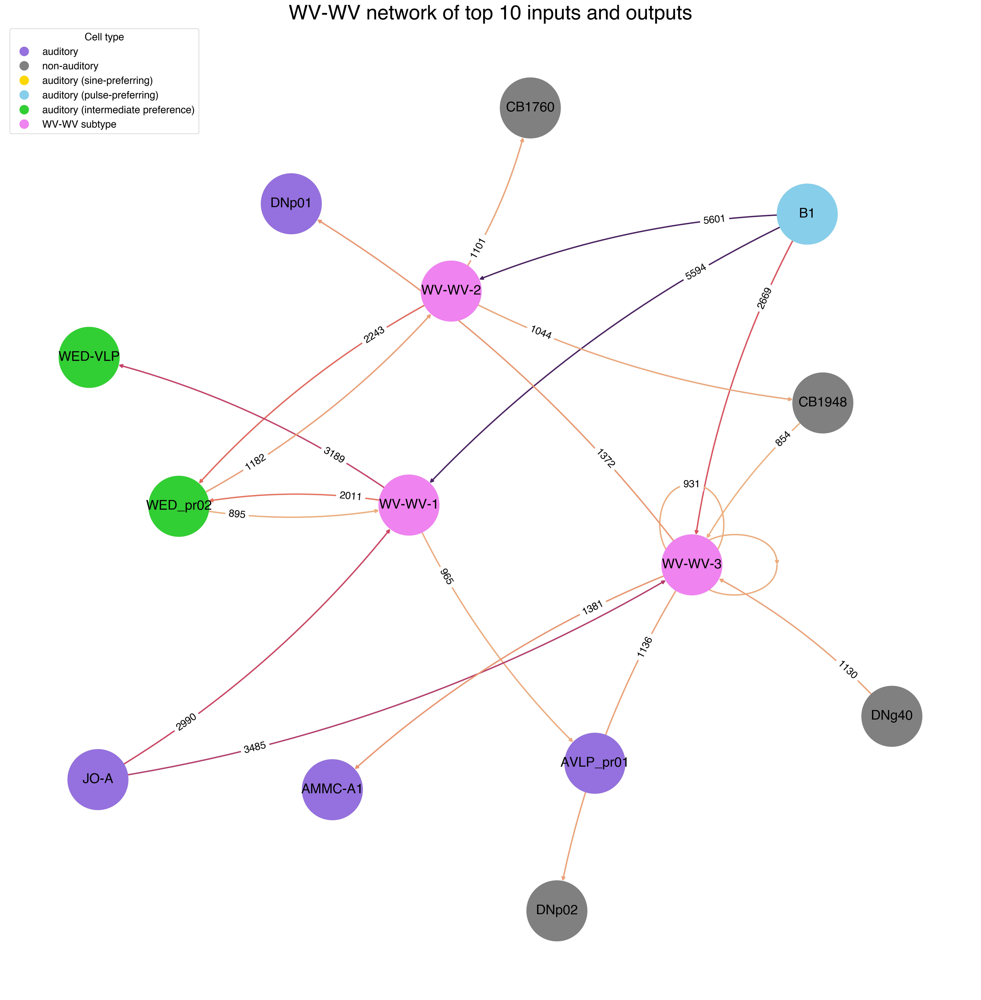

In [152]:
#graph

G6 = nx.MultiDiGraph()

for i, row in wvwv_t10_conns_network.iterrows():
    G6.add_node(row['source'], label=row['source'], color=row['source_color'])
    G6.add_node(row['target'], label=row['target'], color=row['target_color'])

for i, row in wvwv_t10_conns_network.iterrows():
    G6.add_edge(row['source'], row['target'], weight=row['syn_count'])

plt.figure(figsize=(20, 20))

pos = nx.arf_layout(G6, a=2, seed=3)
    

nx.draw(G6, pos, with_labels=True,
        node_color=[data['color'] for node, data in G6.nodes(data=True)],
        node_size=8000,
        font_size=20,
        edge_cmap=seaborn.color_palette('flare', as_cmap=True),
        edge_color=[data['weight'] for u, v, data in G6.edges(data=True)],
        width=2,
        connectionstyle='arc3, rad=0.1'
)

nx.draw_networkx_edge_labels(G6, pos,
                             edge_labels={(u, v): d['weight'] for u, v, d in G6.edges(data=True)},
                             font_size=15,
                             label_pos=0.25,
                             connectionstyle='arc3, rad=0.1'
)

plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='auditory', markerfacecolor='mediumpurple', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='non-auditory', markerfacecolor='grey', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (sine-preferring)', markerfacecolor='gold', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (pulse-preferring)', markerfacecolor='skyblue', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (intermediate preference)', markerfacecolor='limegreen', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='WV-WV subtype', markerfacecolor='violet', markersize=15)  
    ],
    title="Cell type",
    title_fontsize=15,
    loc="upper left",
    fontsize=15
)

plt.title('WV-WV network of top 10 inputs and outputs', fontsize=30)

# Network of top 5 inputs and outputs (for each subtype respectively)

In [153]:
wvwv1_inputs = wvwv_inputs[wvwv_inputs['type_post']=='WV-WV-1']
wvwv1_outputs = wvwv_outputs[wvwv_outputs['type_pre']=='WV-WV-1']
wvwv2_inputs = wvwv_inputs[wvwv_inputs['type_post']=='WV-WV-2']
wvwv2_outputs = wvwv_outputs[wvwv_outputs['type_pre']=='WV-WV-2']
wvwv3_inputs = wvwv_inputs[wvwv_inputs['type_post']=='WV-WV-3']
wvwv3_outputs = wvwv_outputs[wvwv_outputs['type_pre']=='WV-WV-3']
wvwv4_inputs = wvwv_inputs[wvwv_inputs['type_post']=='WV-WV-4']
wvwv4_outputs = wvwv_outputs[wvwv_outputs['type_pre']=='WV-WV-4']

In [154]:
#create new df containing concatenated top 5 inputs for each subtype

wvwv1_T5_inputs = wvwv1_inputs.groupby(['type_pre', 'type_post', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False).head(5)
wvwv2_T5_inputs = wvwv2_inputs.groupby(['type_pre', 'type_post', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False).head(5)
wvwv3_T5_inputs = wvwv3_inputs.groupby(['type_pre', 'type_post', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False).head(5)
wvwv4_T5_inputs = wvwv4_inputs.groupby(['type_pre', 'type_post', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False).head(5)

#concatenate

wvwv_indiv_t5inputs = pd.concat([wvwv1_T5_inputs, wvwv2_T5_inputs, wvwv3_T5_inputs, wvwv4_T5_inputs])
wvwv_indiv_t5inputs

,type_pre,type_post,pref_pre,pref_post,class_pre,class_post,syn_count
30,B1,WV-WV-1,pulse,NaN,auditory,auditory,5594
78,JO-A,WV-WV-1,NaN,NaN,auditory,auditory,2990
100,WED_pr02,WV-WV-1,intermediate,NaN,auditory,auditory,895
48,CB1538,WV-WV-1,NaN,NaN,non-auditory,auditory,647
71,DNg24,WV-WV-1,NaN,NaN,non-auditory,auditory,600
23,B1,WV-WV-2,pulse,NaN,auditory,auditory,5601
115,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory,1182
59,CB1948,WV-WV-2,NaN,NaN,non-auditory,auditory,717
66,CB2238,WV-WV-2,NaN,NaN,non-auditory,auditory,496
69,CB2545,WV-WV-2,NaN,NaN,non-auditory,auditory,463


In [155]:
#take the top 5 output cell types for each subtype

wvwv1_t5outputs = wvwv1_outputs.groupby(['type_pre', 'type_post', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False).head(5)
wvwv2_t5outputs = wvwv2_outputs.groupby(['type_pre', 'type_post', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False).head(5)
wvwv3_t5outputs = wvwv3_outputs.groupby(['type_pre', 'type_post', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False).head(5)
wvwv4_t5outputs = wvwv4_outputs.groupby(['type_pre', 'type_post', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False).head(5)

#concat
wvwv_indiv_t5outputs = pd.concat([wvwv1_t5outputs, wvwv2_t5outputs, wvwv3_t5outputs, wvwv4_t5outputs], ignore_index=True)
wvwv_indiv_t5outputs

,type_pre,type_post,pref_pre,pref_post,class_pre,class_post,syn_count
0,WV-WV-1,WED-VLP,NaN,intermediate,auditory,auditory,3189
1,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory,2011
2,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory,965
3,WV-WV-1,CB1538,NaN,NaN,auditory,non-auditory,818
4,WV-WV-1,CB1110,NaN,NaN,auditory,non-auditory,523
5,WV-WV-2,WED_pr02,NaN,intermediate,auditory,auditory,2243
6,WV-WV-2,CB1760,NaN,NaN,auditory,non-auditory,1101
7,WV-WV-2,CB1948,NaN,NaN,auditory,non-auditory,1044
8,WV-WV-2,CB2238,NaN,NaN,auditory,non-auditory,891
9,WV-WV-2,CB0533,NaN,NaN,auditory,non-auditory,873


In [156]:
wvwv_indiv_t5outputs

,type_pre,type_post,pref_pre,pref_post,class_pre,class_post,syn_count
0,WV-WV-1,WED-VLP,NaN,intermediate,auditory,auditory,3189
1,WV-WV-1,WED_pr02,NaN,intermediate,auditory,auditory,2011
2,WV-WV-1,AVLP_pr01,NaN,sine,auditory,auditory,965
3,WV-WV-1,CB1538,NaN,NaN,auditory,non-auditory,818
4,WV-WV-1,CB1110,NaN,NaN,auditory,non-auditory,523
5,WV-WV-2,WED_pr02,NaN,intermediate,auditory,auditory,2243
6,WV-WV-2,CB1760,NaN,NaN,auditory,non-auditory,1101
7,WV-WV-2,CB1948,NaN,NaN,auditory,non-auditory,1044
8,WV-WV-2,CB2238,NaN,NaN,auditory,non-auditory,891
9,WV-WV-2,CB0533,NaN,NaN,auditory,non-auditory,873


In [157]:
#concat and rename
wvwv_t5_conns = pd.concat([wvwv_indiv_t5inputs, wvwv_indiv_t5outputs])

#rename
wvwv_t5_network = wvwv_t5_conns.rename(columns={'type_pre':'source',
                                                'type_post':'target'})
wvwv_t5_network

,source,target,pref_pre,pref_post,class_pre,class_post,syn_count
30,B1,WV-WV-1,pulse,NaN,auditory,auditory,5594
78,JO-A,WV-WV-1,NaN,NaN,auditory,auditory,2990
100,WED_pr02,WV-WV-1,intermediate,NaN,auditory,auditory,895
48,CB1538,WV-WV-1,NaN,NaN,non-auditory,auditory,647
71,DNg24,WV-WV-1,NaN,NaN,non-auditory,auditory,600
23,B1,WV-WV-2,pulse,NaN,auditory,auditory,5601
115,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory,1182
59,CB1948,WV-WV-2,NaN,NaN,non-auditory,auditory,717
66,CB2238,WV-WV-2,NaN,NaN,non-auditory,auditory,496
69,CB2545,WV-WV-2,NaN,NaN,non-auditory,auditory,463


In [158]:
#color map
class_colordic = {'auditory':'mediumpurple',
                  'non-auditory':'grey'}

wvwv_t5_network['source_color'] = wvwv_t5_network['class_pre'].map(class_colordic)
wvwv_t5_network['target_color'] = wvwv_t5_network['class_post'].map(class_colordic)

#and then individually change the labels for preferences

wvwv_t5_network.loc[wvwv_t5_network['pref_pre'] == 'intermediate', 'source_color'] = 'limegreen'
wvwv_t5_network.loc[wvwv_t5_network['pref_post'] == 'intermediate', 'target_color'] = 'limegreen'
wvwv_t5_network.loc[wvwv_t5_network['pref_pre'] == 'sine', 'source_color'] = 'gold'
wvwv_t5_network.loc[wvwv_t5_network['pref_post'] == 'sine', 'target_color'] = 'gold'
wvwv_t5_network.loc[wvwv_t5_network['pref_pre'] == 'pulse', 'source_color'] = 'skyblue'
wvwv_t5_network.loc[wvwv_t5_network['pref_post'] == 'pulse', 'target_color'] = 'skyblue'


#finally change wvwv
wvwv_t5_network.loc[wvwv_t5_network['source'].str.contains('WV-WV'), 'source_color'] = 'violet'
wvwv_t5_network.loc[wvwv_t5_network['target'].str.contains('WV-WV'), 'target_color'] = 'violet'

wvwv_t5_network

,source,target,pref_pre,pref_post,class_pre,class_post,syn_count,source_color,target_color
30,B1,WV-WV-1,pulse,NaN,auditory,auditory,5594,skyblue,violet
78,JO-A,WV-WV-1,NaN,NaN,auditory,auditory,2990,mediumpurple,violet
100,WED_pr02,WV-WV-1,intermediate,NaN,auditory,auditory,895,limegreen,violet
48,CB1538,WV-WV-1,NaN,NaN,non-auditory,auditory,647,grey,violet
71,DNg24,WV-WV-1,NaN,NaN,non-auditory,auditory,600,grey,violet
23,B1,WV-WV-2,pulse,NaN,auditory,auditory,5601,skyblue,violet
115,WED_pr02,WV-WV-2,intermediate,NaN,auditory,auditory,1182,limegreen,violet
59,CB1948,WV-WV-2,NaN,NaN,non-auditory,auditory,717,grey,violet
66,CB2238,WV-WV-2,NaN,NaN,non-auditory,auditory,496,grey,violet
69,CB2545,WV-WV-2,NaN,NaN,non-auditory,auditory,463,grey,violet


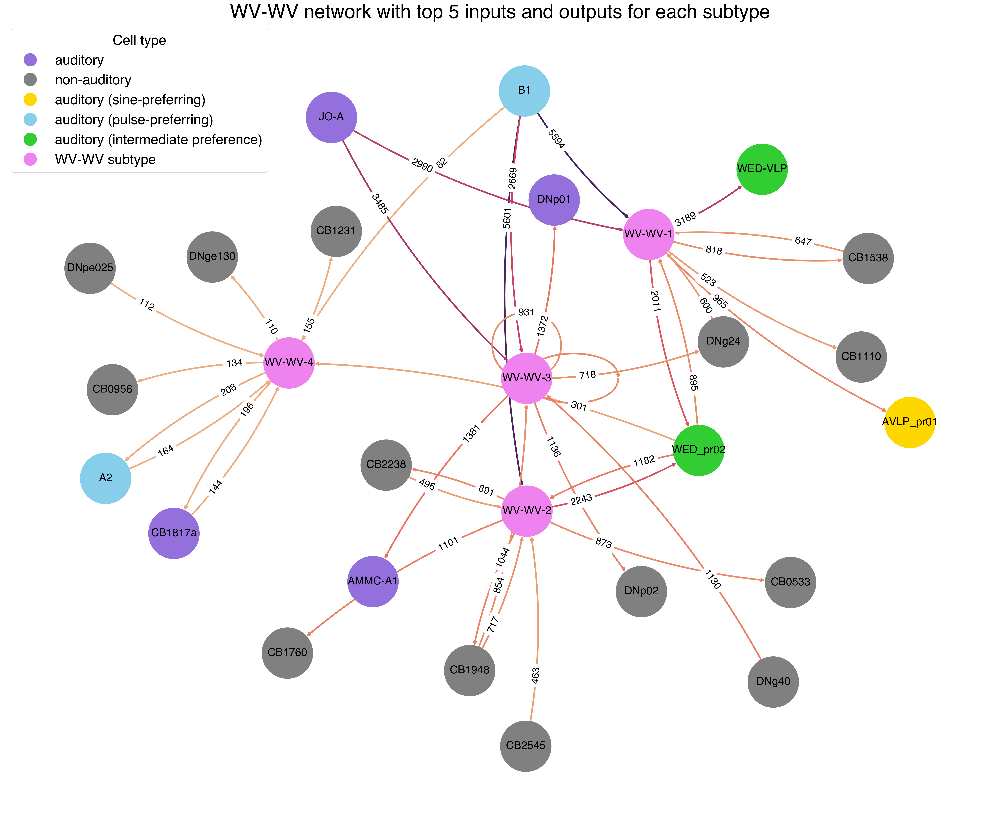

In [159]:
#graph

G_t5 = nx.MultiDiGraph()

for i, row in wvwv_t5_network.iterrows():
    G_t5.add_node(row['source'], label=row['source'], color=row['source_color'])
    G_t5.add_node(row['target'], label=row['target'], color=row['target_color'])

for i, row in wvwv_t5_network.iterrows():
    G_t5.add_edge(row['source'], row['target'], weight=row['syn_count'])

plt.figure(figsize=(25, 20))
pos = nx.arf_layout(G_t5, seed=27, scaling=3, a=3.5)
nx.draw(G_t5, pos, with_labels=True,
        node_color=[data['color'] for node, data in G_t5.nodes(data=True)],
        node_size=8500,
        font_size=20,
        edge_cmap=seaborn.color_palette('flare', as_cmap=True),
        edge_color=[data['weight'] for u, v, data in G_t5.edges(data=True)],
        width=3,
        connectionstyle='arc3,rad=0.1')

nx.draw_networkx_edge_labels(G_t5, pos,
                            edge_labels={(u, v): d['weight'] for u, v, d in G_t5.edges(data=True)},
                            font_size=18,
                            label_pos=0.3,
                            connectionstyle='arc3,rad=0.1')



plt.title('WV-WV network with top 5 inputs and outputs for each subtype', fontsize=35)
plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='auditory', markerfacecolor='mediumpurple', markersize=25),
        plt.Line2D([0], [0], marker='o', color='w', label='non-auditory', markerfacecolor='grey', markersize=25),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (sine-preferring)', markerfacecolor='gold', markersize=25),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (pulse-preferring)', markerfacecolor='skyblue', markersize=25),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (intermediate preference)', markerfacecolor='limegreen', markersize=25),
        plt.Line2D([0], [0], marker='o', color='w', label='WV-WV subtype', markerfacecolor='violet', markersize=25)
    ],
    title="Cell type",
    title_fontsize=25,
    loc="upper left",
    fontsize=25
)

# Individual pathways

In [164]:
#copy primacy df from primacy analysis

#filter out all connections with synapse counts below 5

threshold = 5
wvwv_inputs_abovethresh = wvwv_inputs[wvwv_inputs['syn_count']>=threshold]

#group by cell type and sort in descending order
wvwv_input_types = wvwv_inputs_abovethresh.groupby(['type_pre'], as_index=False)[['syn_count']].sum().sort_values(by=('syn_count'), ascending=False)

#create copy of above df to prevent settingwithcopy warning
primacy = wvwv_input_types.copy()

#rename syn_count to summed syn counts
primacy = primacy.rename(columns={'syn_count':'total_syn_count'})
primacy

,type_pre,total_syn_count
70,B1,13946
201,JO-A,6826
240,WED_pr02,2425
128,CB1948,1856
173,DNg40,1174
...,...,...
93,CB0979,5
175,DNg84,5
16,AN_AVLP_52,5
97,CB1044,5


In [165]:
#add columns for synapse weights/counts and output rank for wv-wv

primacy['top_wvwv_rank'] = 0
primacy['wvwv1_rank'] = 0
primacy['wvwv1_syncount'] = 0
primacy['wvwv2_rank'] = 0
primacy['wvwv2_syncount'] = 0
primacy['wvwv3_rank'] = 0
primacy['wvwv3_syncount'] = 0
primacy['wvwv4_rank'] = 0
primacy['wvwv4_syncount'] = 0


primacy = primacy[['type_pre', 'total_syn_count', 'top_wvwv_rank', 'wvwv1_rank', 'wvwv2_rank', 'wvwv3_rank', 'wvwv4_rank', 'wvwv1_syncount', 'wvwv2_syncount', 'wvwv3_syncount', 'wvwv4_syncount']]
primacy

,type_pre,total_syn_count,top_wvwv_rank,wvwv1_rank,wvwv2_rank,wvwv3_rank,wvwv4_rank,wvwv1_syncount,wvwv2_syncount,wvwv3_syncount,wvwv4_syncount
70,B1,13946,0,0,0,0,0,0,0,0,0
201,JO-A,6826,0,0,0,0,0,0,0,0,0
240,WED_pr02,2425,0,0,0,0,0,0,0,0,0
128,CB1948,1856,0,0,0,0,0,0,0,0,0
173,DNg40,1174,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
93,CB0979,5,0,0,0,0,0,0,0,0,0
175,DNg84,5,0,0,0,0,0,0,0,0,0
16,AN_AVLP_52,5,0,0,0,0,0,0,0,0,0
97,CB1044,5,0,0,0,0,0,0,0,0,0


In [166]:
#create for loop to set values into new columns

for idx, row in primacy.iterrows():
    #filter df to find all outputs for each given input cell type, then group by postsynaptic cell type, sum synapse counts, and sort in descending order
    outputs = conns_types[conns_types['type_pre']==row.type_pre].groupby('type_post', as_index=False)[['syn_count']].sum().sort_values(by=('syn_count'), ascending=False, ignore_index=True)
    #locate 
    wvwv = outputs[outputs['type_post'].str.contains('WV-WV')]
    primacy.loc[idx, 'top_wvwv_rank'] = wvwv.index.values[0]

    wvwv1 = outputs[outputs['type_post']=='WV-WV-1'] #filter outputs df to find connection row where that input cell connects to wv-wv-1
    if len(wvwv1) == 0: #if the input cell doesn't connect to wv-wv-1, fill column value as nan
        primacy.loc[idx, 'wvwv1_rank'] = np.nan
        primacy.loc[idx, 'wvwv1_syncount'] = np.nan
    else: #if it does connect/send inputs to wv-wv-1:
        primacy.loc[idx, 'wvwv1_rank'] = wvwv1.index.values[0] #fill rank column with descending order rank of this cell's connection with wv-wv-1
        primacy.loc[idx, 'wvwv1_syncount'] = wvwv1['syn_count'].values[0] #fill synapse column with the corresponding syncount of this connection

    wvwv2 = outputs[outputs['type_post']=='WV-WV-2']
    if len(wvwv2) == 0:
        primacy.loc[idx, 'wvwv2_rank'] = np.nan
        primacy.loc[idx, 'wvwv2_syncount'] = np.nan
    else:
        primacy.loc[idx, 'wvwv2_rank'] = wvwv2.index.values[0]
        primacy.loc[idx, 'wvwv2_syncount'] = wvwv2['syn_count'].values[0]

    wvwv3 = outputs[outputs['type_post']=='WV-WV-3']
    if len(wvwv3) == 0:
        primacy.loc[idx, 'wvwv3_rank'] = np.nan
        primacy.loc[idx, 'wvwv3_syncount'] = np.nan
    else:
        primacy.loc[idx, 'wvwv3_rank'] = wvwv3.index.values[0]
        primacy.loc[idx, 'wvwv3_syncount'] = wvwv3['syn_count'].values[0]

    wvwv4 = outputs[outputs['type_post']=='WV-WV-4']
    if len(wvwv4) == 0:
        primacy.loc[idx, 'wvwv4_rank'] = np.nan
        primacy.loc[idx, 'wvwv4_syncount'] = np.nan
    else:
        primacy.loc[idx, 'wvwv4_rank'] = wvwv4.index.values[0]
        primacy.loc[idx, 'wvwv4_syncount'] = wvwv4['syn_count'].values[0]

primacy

,type_pre,total_syn_count,top_wvwv_rank,wvwv1_rank,wvwv2_rank,wvwv3_rank,wvwv4_rank,wvwv1_syncount,wvwv2_syncount,wvwv3_syncount,wvwv4_syncount
70,B1,13946,2,3.0,2.0,11.0,215.0,5594.0,5601.0,2669.0,82.0
201,JO-A,6826,0,1.0,36.0,0.0,85.0,2990.0,296.0,3485.0,55.0
240,WED_pr02,2425,4,5.0,4.0,74.0,22.0,895.0,1182.0,47.0,301.0
128,CB1948,1856,0,5.0,1.0,0.0,NaN,285.0,717.0,854.0,NaN
173,DNg40,1174,0,35.0,63.0,0.0,23.0,14.0,5.0,1130.0,25.0
...,...,...,...,...,...,...,...,...,...,...,...
93,CB0979,5,42,NaN,42.0,NaN,NaN,NaN,5.0,NaN,NaN
175,DNg84,5,73,NaN,NaN,NaN,73.0,NaN,NaN,NaN,5.0
16,AN_AVLP_52,5,74,NaN,NaN,74.0,NaN,NaN,NaN,5.0,NaN
97,CB1044,5,74,NaN,74.0,NaN,NaN,NaN,5.0,NaN,NaN


## WV-WV-1

In [167]:
#wv-wv-1
#look at first order one hop connections and then go one hop further in presyn and postsyn direction

wv1_inputs_grouped = wvwv1_inputs.groupby(['type_pre', 'type_post', 'nt_type', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False)
wv1_outputs_grouped = wvwv1_outputs.groupby(['type_pre', 'type_post', 'nt_type', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False)

wv1_input_types = wv1_inputs_grouped['type_pre'].head(5)
wv1_output_types = wv1_outputs_grouped['type_post'].head(5)

In [168]:
#find primary inputs
wv1_primary_inputs = primacy[primacy['wvwv1_rank']==0]['type_pre'].tolist()
wv1_primary_inputs

['CB1538', 'DNg24', 'CB0027', 'SAD023']

In [169]:
#what are the primary inputs of those primary inputs?
wv1_primaryinputs_inputs = conns_types[conns_types['type_post'].isin(wv1_primary_inputs)][['type_pre']].drop_duplicates()
wv1_primaryinputs_inputs

,type_pre
1300,WV-WV-3
3611,AN_GNG_SAD_3
8975,NaN
8989,AN_multi_8
18815,WV-WV-1
...,...
3255126,AN_AVLP_GNG_21
3361378,CB0089
3390212,CB1023
3585538,DNp02


In [170]:
wv1_primaryinputs_primacy = wv1_primaryinputs_inputs.copy()

wv1_primaryinputs_primacy['CB1538_rank'] = 0
wv1_primaryinputs_primacy['DNg24_rank'] = 0
wv1_primaryinputs_primacy['CB0027_rank'] = 0
wv1_primaryinputs_primacy['SAD023_rank'] = 0
wv1_primaryinputs_primacy['CB1538_syncount'] = 0
wv1_primaryinputs_primacy['DNg24_syncount'] = 0
wv1_primaryinputs_primacy['CB0027_syncount'] = 0
wv1_primaryinputs_primacy['SAD023_syncount'] = 0

wv1_primaryinputs_primacy

,type_pre,CB1538_rank,DNg24_rank,CB0027_rank,SAD023_rank,CB1538_syncount,DNg24_syncount,CB0027_syncount,SAD023_syncount
1300,WV-WV-3,0,0,0,0,0,0,0,0
3611,AN_GNG_SAD_3,0,0,0,0,0,0,0,0
8975,NaN,0,0,0,0,0,0,0,0
8989,AN_multi_8,0,0,0,0,0,0,0,0
18815,WV-WV-1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
3255126,AN_AVLP_GNG_21,0,0,0,0,0,0,0,0
3361378,CB0089,0,0,0,0,0,0,0,0
3390212,CB1023,0,0,0,0,0,0,0,0
3585538,DNp02,0,0,0,0,0,0,0,0


In [171]:
#create for loop to set values into new columns

for idx, row in wv1_primaryinputs_primacy.iterrows():
    #filter df to find all outputs for each given input cell type, then group by postsynaptic cell type, sum synapse counts, and sort in descending order
    outputs = conns_types[conns_types['type_pre']==row.type_pre].groupby('type_post', as_index=False)[['syn_count']].sum().sort_values(by=('syn_count'), ascending=False, ignore_index=True)

    input1 = outputs[outputs['type_post']=='CB1538']
    if len(input1) == 0:
        wv1_primaryinputs_primacy.loc[idx, 'CB1538_rank'] = np.nan
        wv1_primaryinputs_primacy.loc[idx, 'CB1538_syncount'] = np.nan
    else:
        wv1_primaryinputs_primacy.loc[idx, 'CB1538_rank'] = input1.index.values[0]
        wv1_primaryinputs_primacy.loc[idx, 'CB1538_syncount'] = input1['syn_count'].values[0]

    input2 = outputs[outputs['type_post']=='DNg24']
    if len(input2) == 0:
        wv1_primaryinputs_primacy.loc[idx, 'DNg24_rank'] = np.nan
        wv1_primaryinputs_primacy.loc[idx, 'DNg24_syncount'] = np.nan
    else:
        wv1_primaryinputs_primacy.loc[idx, 'DNg24_rank'] = input2.index.values[0]
        wv1_primaryinputs_primacy.loc[idx, 'DNg24_syncount'] = input2['syn_count'].values[0]

    input3 = outputs[outputs['type_post']=='CB0027']
    if len(input3) == 0:
        wv1_primaryinputs_primacy.loc[idx, 'CB0027_rank'] = np.nan
        wv1_primaryinputs_primacy.loc[idx, 'CB0027_syncount'] = np.nan
    else:
        wv1_primaryinputs_primacy.loc[idx, 'CB0027_rank'] = input3.index.values[0]
        wv1_primaryinputs_primacy.loc[idx, 'CB0027_syncount'] = input3['syn_count'].values[0]

    input4 = outputs[outputs['type_post']=='SAD023']
    if len(input4) == 0:
        wv1_primaryinputs_primacy.loc[idx, 'SAD023_rank'] = np.nan
        wv1_primaryinputs_primacy.loc[idx, 'SAD023_syncount'] = np.nan
    else:
        wv1_primaryinputs_primacy.loc[idx, 'SAD023_rank'] = input4.index.values[0]
        wv1_primaryinputs_primacy.loc[idx, 'SAD023_syncount'] = input4['syn_count'].values[0]

wv1_primaryinputs_primacy

,type_pre,CB1538_rank,DNg24_rank,CB0027_rank,SAD023_rank,CB1538_syncount,DNg24_syncount,CB0027_syncount,SAD023_syncount
1300,WV-WV-3,9.0,4.0,38.0,25.0,316.0,718.0,80.0,121.0
3611,AN_GNG_SAD_3,29.0,1.0,NaN,NaN,61.0,476.0,NaN,NaN
8975,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8989,AN_multi_8,10.0,6.0,209.0,NaN,217.0,309.0,5.0,NaN
18815,WV-WV-1,3.0,15.0,42.0,122.0,818.0,220.0,78.0,14.0
...,...,...,...,...,...,...,...,...,...
3255126,AN_AVLP_GNG_21,NaN,NaN,NaN,69.0,NaN,NaN,NaN,5.0
3361378,CB0089,156.0,NaN,NaN,NaN,5.0,NaN,NaN,NaN
3390212,CB1023,NaN,48.0,NaN,NaN,NaN,5.0,NaN,NaN
3585538,DNp02,NaN,NaN,NaN,57.0,NaN,NaN,NaN,5.0


In [172]:
#seems like primary inputs to wv-wv-1 don't have any primary inputs?
wv1_primaryinputs_primacy[wv1_primaryinputs_primacy['CB0027_rank']==0.0] #checked every single primary input cell type, is not there

,type_pre,CB1538_rank,DNg24_rank,CB0027_rank,SAD023_rank,CB1538_syncount,DNg24_syncount,CB0027_syncount,SAD023_syncount


Since WV-WV-1's primary inputs have no primary inputs, I'm going to take the top 3 inputs of each primary input respectively.

In [173]:
conns_types_grouped = conns_types.groupby(['type_pre', 'type_post', 'nt_type', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False)
conns_types_grouped

,type_pre,type_post,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
414149,R1-6,L2,ACH,NaN,NaN,non-auditory,non-auditory,287451
289805,L2,Tm1,ACH,NaN,NaN,non-auditory,non-auditory,284280
414139,R1-6,L1,ACH,NaN,NaN,non-auditory,non-auditory,227176
289806,L2,Tm2,ACH,NaN,NaN,non-auditory,non-auditory,214749
461372,Tm1,Pm03,ACH,NaN,NaN,non-auditory,non-auditory,188073
...,...,...,...,...,...,...,...,...
446507,SMP332b,AOTUv1A_T01,ACH,NaN,NaN,non-auditory,non-auditory,5
244396,CL321,LAL021,ACH,NaN,NaN,non-auditory,non-auditory,5
446505,SMP332a,SMP566a,ACH,NaN,NaN,non-auditory,non-auditory,5
244398,CL321,LAL081,ACH,NaN,NaN,non-auditory,non-auditory,5


In [174]:
#cells two hops in presynaptic direction
input1top = conns_types_grouped[conns_types_grouped['type_post']==(wv1_primary_inputs[0])].head(3)
input2top = conns_types_grouped[conns_types_grouped['type_post']==(wv1_primary_inputs[1])].head(3)
input3top = conns_types_grouped[conns_types_grouped['type_post']==(wv1_primary_inputs[2])].head(3)
input4top = conns_types_grouped[conns_types_grouped['type_post']==(wv1_primary_inputs[3])].head(3)

wv1twohops_upstream = pd.concat([input1top, input2top, input3top, input4top])
wv1twohops_upstream

,type_pre,type_post,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
80373,B1,CB1538,ACH,pulse,NaN,auditory,non-auditory,1145
287138,JO-A,CB1538,ACH,NaN,NaN,auditory,non-auditory,842
489658,WV-WV-1,CB1538,GABA,NaN,NaN,auditory,non-auditory,818
287202,JO-A,DNg24,ACH,NaN,NaN,auditory,non-auditory,1638
512825,NaN,DNg24,GABA,NaN,NaN,non-auditory,non-auditory,725
489998,WV-WV-3,DNg24,GABA,NaN,NaN,auditory,non-auditory,718
80292,B1,CB0027,ACH,pulse,NaN,auditory,non-auditory,183
489935,WV-WV-3,CB0027,GABA,NaN,NaN,auditory,non-auditory,80
489626,WV-WV-1,CB0027,GABA,NaN,NaN,auditory,non-auditory,78
80636,B1,SAD023,ACH,pulse,NaN,auditory,non-auditory,317


In [175]:
#find cells two hops away in postsynaptic direction
wv1twohops_downstream = conns_types[conns_types['type_pre'].isin(wv1_output_types)].groupby(['type_pre', 'type_post', 'nt_type', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False).head(10)
wv1twohops_downstream

,type_pre,type_post,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
356,WED-VLP,AVLP_pr01,ACH,intermediate,sine,auditory,auditory,4508
491,WED_pr02,B1,GABA,intermediate,pulse,auditory,auditory,3813
595,WED_pr02,WED-VLP,GABA,intermediate,intermediate,auditory,auditory,2553
609,WED_pr02,WED_pr02,GABA,intermediate,intermediate,auditory,auditory,1661
548,WED_pr02,CB2545,GABA,intermediate,NaN,auditory,non-auditory,1643
334,WED-VLP,AVLP083,ACH,intermediate,NaN,auditory,non-auditory,1548
454,WED-VLP,WED_pr02,ACH,intermediate,intermediate,auditory,auditory,1445
157,AVLP_pr01,WED-VLP,GABA,sine,intermediate,auditory,auditory,1373
611,WED_pr02,WV-WV-2,GABA,intermediate,NaN,auditory,auditory,1182
169,AVLP_pr01,vpoEN,GABA,sine,NaN,auditory,auditory,1032


In [177]:
#primary inputs and top 5 outputs

wv1_priminput_conns = wv1_inputs_grouped[wv1_inputs_grouped['type_pre'].isin(wv1_primary_inputs)]
wv1_t5output_conns = wv1_outputs_grouped[wv1_outputs_grouped['type_post'].isin(wv1_output_types)]
display(wv1_priminput_conns, wv1_t5output_conns)

,type_pre,type_post,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
49,CB1538,WV-WV-1,GABA,NaN,NaN,non-auditory,auditory,647
73,DNg24,WV-WV-1,GABA,NaN,NaN,non-auditory,auditory,600
32,CB0027,WV-WV-1,GABA,NaN,NaN,non-auditory,auditory,186
96,SAD023,WV-WV-1,GABA,NaN,NaN,non-auditory,auditory,150


,type_pre,type_post,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
164,WV-WV-1,WED-VLP,GABA,NaN,intermediate,auditory,auditory,3189
179,WV-WV-1,WED_pr02,GABA,NaN,intermediate,auditory,auditory,2011
31,WV-WV-1,AVLP_pr01,GABA,NaN,sine,auditory,auditory,965
67,WV-WV-1,CB1538,GABA,NaN,NaN,auditory,non-auditory,818
54,WV-WV-1,CB1110,GABA,NaN,NaN,auditory,non-auditory,523


In [178]:
#make a network graph

wv1_extendednetwork = pd.concat([wv1twohops_upstream, wv1_priminput_conns, wv1_t5output_conns, wv1twohops_downstream], ignore_index=True).rename(columns={'type_pre':'source', 'type_post':'target'})
wv1_extendednetwork

,source,target,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
0,B1,CB1538,ACH,pulse,NaN,auditory,non-auditory,1145
1,JO-A,CB1538,ACH,NaN,NaN,auditory,non-auditory,842
2,WV-WV-1,CB1538,GABA,NaN,NaN,auditory,non-auditory,818
3,JO-A,DNg24,ACH,NaN,NaN,auditory,non-auditory,1638
4,NaN,DNg24,GABA,NaN,NaN,non-auditory,non-auditory,725
5,WV-WV-3,DNg24,GABA,NaN,NaN,auditory,non-auditory,718
6,B1,CB0027,ACH,pulse,NaN,auditory,non-auditory,183
7,WV-WV-3,CB0027,GABA,NaN,NaN,auditory,non-auditory,80
8,WV-WV-1,CB0027,GABA,NaN,NaN,auditory,non-auditory,78
9,B1,SAD023,ACH,pulse,NaN,auditory,non-auditory,317


In [179]:
#add colors

wv1_extendednetwork['source_color'] = wv1_extendednetwork['class_pre'].map(class_colordic)
wv1_extendednetwork['target_color'] = wv1_extendednetwork['class_post'].map(class_colordic)

wv1_extendednetwork.loc[wv1_extendednetwork['pref_pre']=='pulse', 'source_color'] = 'skyblue'
wv1_extendednetwork.loc[wv1_extendednetwork['pref_pre']=='sine', 'source_color'] = 'gold'
wv1_extendednetwork.loc[wv1_extendednetwork['pref_pre']=='intermediate', 'source_color'] = 'limegreen'
wv1_extendednetwork.loc[wv1_extendednetwork['pref_post']=='pulse', 'target_color'] = 'skyblue'
wv1_extendednetwork.loc[wv1_extendednetwork['pref_post']=='sine', 'target_color'] = 'gold'
wv1_extendednetwork.loc[wv1_extendednetwork['pref_post']=='intermediate', 'target_color'] = 'limegreen'

wv1_extendednetwork.loc[wv1_extendednetwork['source']=='WV-WV-1', 'source_color'] = 'violet'
wv1_extendednetwork.loc[wv1_extendednetwork['target']=='WV-WV-1', 'target_color'] = 'violet'

wv1_extendednetwork

,source,target,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count,source_color,target_color
0,B1,CB1538,ACH,pulse,NaN,auditory,non-auditory,1145,skyblue,grey
1,JO-A,CB1538,ACH,NaN,NaN,auditory,non-auditory,842,mediumpurple,grey
2,WV-WV-1,CB1538,GABA,NaN,NaN,auditory,non-auditory,818,violet,grey
3,JO-A,DNg24,ACH,NaN,NaN,auditory,non-auditory,1638,mediumpurple,grey
4,NaN,DNg24,GABA,NaN,NaN,non-auditory,non-auditory,725,grey,grey
5,WV-WV-3,DNg24,GABA,NaN,NaN,auditory,non-auditory,718,mediumpurple,grey
6,B1,CB0027,ACH,pulse,NaN,auditory,non-auditory,183,skyblue,grey
7,WV-WV-3,CB0027,GABA,NaN,NaN,auditory,non-auditory,80,mediumpurple,grey
8,WV-WV-1,CB0027,GABA,NaN,NaN,auditory,non-auditory,78,violet,grey
9,B1,SAD023,ACH,pulse,NaN,auditory,non-auditory,317,skyblue,grey


In [180]:
#what are the additional type names for source/target cells in this network?

wv1_extendednetwork_sources = wv1_extendednetwork['source'].drop_duplicates()
wv1_extendednetwork_targets = wv1_extendednetwork['target'].drop_duplicates()

wv1_extendednetwork_celltypes = pd.concat([wv1_extendednetwork_sources, wv1_extendednetwork_targets]).drop_duplicates().tolist()

celltypes[celltypes['type'].isin(wv1_extendednetwork_celltypes)][['type', 'additional_type(s)']].drop_duplicates()

,type,additional_type(s)
55,CB1538,NaN
220,WV-WV-3,NaN
1275,WV-WV-2,NaN
3467,JO-A,NaN
9413,CB0027,NaN
33492,CB1110,NaN
36870,PVLP010,NaN
37913,CB2545,NaN
38697,vpoEN,NaN
52868,WV-WV-1,NaN


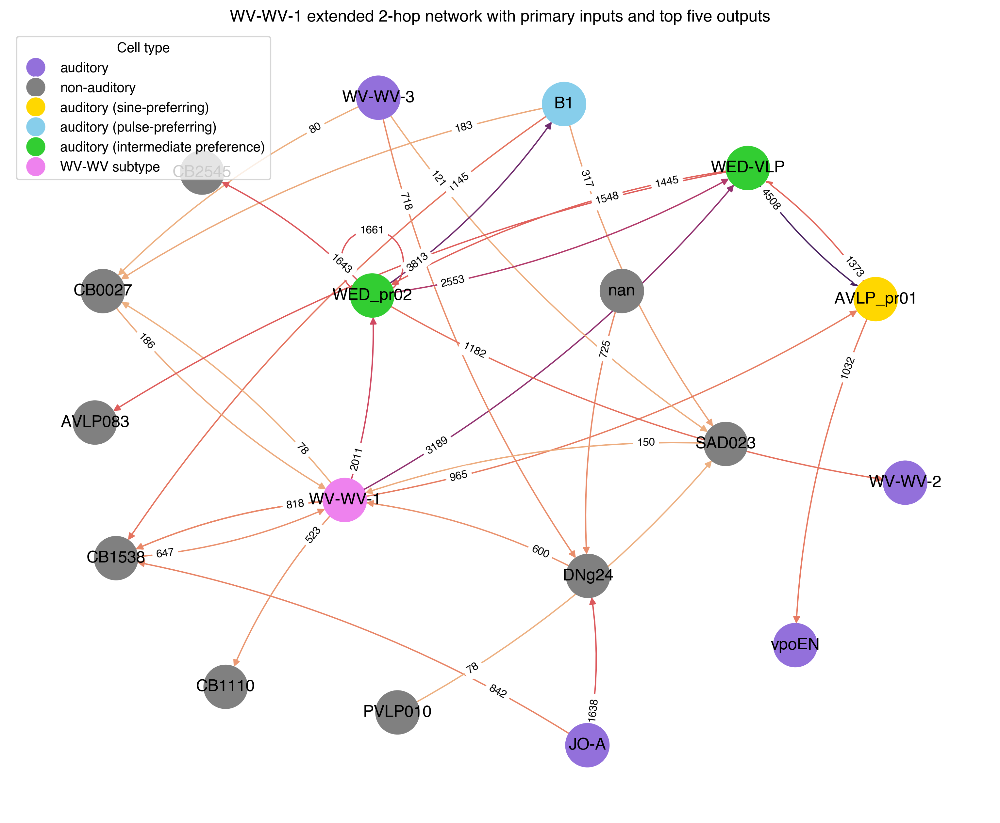

In [181]:
#graph

Gwv1 = nx.MultiDiGraph()

for i, row in wv1_extendednetwork.iterrows():
    Gwv1.add_node(row['source'], label=row['source'], color=row['source_color'])
    Gwv1.add_node(row['target'], label=row['target'], color=row['target_color'])

for i, row in wv1_extendednetwork.iterrows():
    Gwv1.add_edge(row['source'], row['target'], weight=row['syn_count'])

plt.figure(figsize=(10, 8))
pos=nx.arf_layout(Gwv1, seed=1, scaling=2)

nx.draw(Gwv1, pos, with_labels=True,
        node_color=[data['color'] for node, data in Gwv1.nodes(data=True)],
        node_size=1000,
        edge_cmap=seaborn.color_palette('flare', as_cmap=True),
        edge_color=[data['weight'] for u, v, data in Gwv1.edges(data=True)],
        connectionstyle='arc3, rad=0.1')

nx.draw_networkx_edge_labels(Gwv1, pos,
                             edge_labels={(u, v): d['weight'] for u, v, d in Gwv1.edges(data=True)},
                             label_pos=0.2,
                             font_size=8,
                             connectionstyle='arc3, rad=0.1')

plt.title('WV-WV-1 extended 2-hop network with primary inputs and top five outputs')
plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='auditory', markerfacecolor='mediumpurple', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='non-auditory', markerfacecolor='grey', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (sine-preferring)', markerfacecolor='gold', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (pulse-preferring)', markerfacecolor='skyblue', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (intermediate preference)', markerfacecolor='limegreen', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='WV-WV subtype', markerfacecolor='violet', markersize=15)
    ],
    title="Cell type",
    loc="upper left",
)



## WV-WV-2
Replicate what was just done above for WV-WV-1 for all the other subtypes

In [182]:
wv2_inputs_grouped = wvwv2_inputs.groupby(['type_pre', 'type_post', 'nt_type', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False, ignore_index=True)
wv2_outputs_grouped = wvwv2_outputs.groupby(['type_pre', 'type_post', 'nt_type', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False, ignore_index=True)

wv2_input_types = wv2_inputs_grouped['type_pre'].head(5)
wv2_output_types = wv2_outputs_grouped['type_post'].head(5)

In [183]:
#find primary inputs
wv2_primary_inputs = primacy[primacy['wvwv2_rank']==0]['type_pre'].tolist()
wv2_primary_inputs #okay so there is only one...

['CB1557']

In [184]:
#what is the primary input of this primary input?

wv2_primaryinputs_inputs = conns_types[conns_types['type_post'].isin(wv2_primary_inputs)][['type_pre']].drop_duplicates()
wv2_primaryinputs_inputs

,type_pre
23402,DNg29
32786,WV-WV-1
42230,CB0466
42335,DNge130
67508,AVLP083
...,...
3446566,CB2478
3516871,DNpe025
3524970,AVLP209
3615542,CB1484


In [185]:
wv2_primaryinputs_primacy = wv2_primaryinputs_inputs.copy()

for idx, row in wv2_primaryinputs_primacy.iterrows():
    outputs = conns_types[conns_types['type_pre']==row.type_pre].groupby('type_post', as_index=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False, ignore_index=True)

    input = outputs[outputs['type_post']=='CB1557']
    if len(input) == 0:
        wv2_primaryinputs_primacy.loc[idx, 'CB1537_rank'] = np.nan
        wv2_primaryinputs_primacy.loc[idx, 'CB1537_syncount'] = np.nan
    else:
        wv2_primaryinputs_primacy.loc[idx, 'CB1537_rank'] = input.index.values[0]
        wv2_primaryinputs_primacy.loc[idx, 'CB1537_syncount'] = input['syn_count'].values[0]

wv2_primaryinputs_primacy

,type_pre,CB1537_rank,CB1537_syncount
23402,DNg29,3.0,324.0
32786,WV-WV-1,8.0,470.0
42230,CB0466,6.0,301.0
42335,DNge130,0.0,301.0
67508,AVLP083,30.0,207.0
...,...,...,...
3446566,CB2478,40.0,5.0
3516871,DNpe025,72.0,5.0
3524970,AVLP209,322.0,5.0
3615542,CB1484,45.0,5.0


In [186]:
#find all primary inputs

wv2_priminputs_ofpriminputs = wv2_primaryinputs_primacy[wv2_primaryinputs_primacy['CB1537_rank']==0]['type_pre'].tolist()
wv2_priminputs_ofpriminputs

['DNge130', 'CB3384', 'CB3742']

In [187]:
#connections from primary inputs to primary inputs of wv-wv-2

wv2pi_to_pi = conns_types_grouped[(conns_types_grouped['type_pre'].isin(wv2_priminputs_ofpriminputs)) & (conns_types_grouped['type_post'].isin(wv2_primary_inputs))]
wv2pi_to_pi

,type_pre,type_post,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
269707,DNge130,CB1557,ACH,NaN,NaN,non-auditory,non-auditory,301
212865,CB3384,CB1557,GLUT,NaN,NaN,non-auditory,non-auditory,98
225830,CB3742,CB1557,GABA,NaN,NaN,non-auditory,non-auditory,89


In [188]:
wv2twohops_downstream = conns_types[conns_types['type_pre'].isin(wv2_output_types)].groupby(['type_pre', 'type_post', 'nt_type', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False).head(10)
wv2twohops_downstream

,type_pre,type_post,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
344,WED_pr02,B1,GABA,intermediate,pulse,auditory,auditory,3813
448,WED_pr02,WED-VLP,GABA,intermediate,intermediate,auditory,auditory,2553
462,WED_pr02,WED_pr02,GABA,intermediate,intermediate,auditory,auditory,1661
401,WED_pr02,CB2545,GABA,intermediate,NaN,auditory,non-auditory,1643
464,WED_pr02,WV-WV-2,GABA,intermediate,NaN,auditory,auditory,1182
114,CB1760,B1,GABA,NaN,pulse,non-auditory,auditory,1046
258,CB2238,B1,GABA,NaN,pulse,non-auditory,auditory,947
463,WED_pr02,WV-WV-1,GABA,intermediate,NaN,auditory,auditory,895
454,WED_pr02,WED072,GABA,intermediate,NaN,auditory,non-auditory,878
252,CB1948,WV-WV-3,GABA,NaN,NaN,non-auditory,auditory,854


In [189]:
#concat everything

wv2_priminput_conns = wv2_inputs_grouped[wv2_inputs_grouped['type_pre'].isin(wv2_primary_inputs)]
wv2_t5output_conns = wv2_outputs_grouped[wv2_outputs_grouped['type_post'].isin(wv2_output_types)]

wv2_extendednetwork = pd.concat([wv2pi_to_pi, wv2_priminput_conns, wv2_t5output_conns, wv2twohops_downstream]).rename(columns={'type_pre':'source', 'type_post':'target'})
wv2_extendednetwork

,source,target,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
269707,DNge130,CB1557,ACH,NaN,NaN,non-auditory,non-auditory,301
212865,CB3384,CB1557,GLUT,NaN,NaN,non-auditory,non-auditory,98
225830,CB3742,CB1557,GABA,NaN,NaN,non-auditory,non-auditory,89
7,CB1557,WV-WV-2,ACH,NaN,NaN,non-auditory,auditory,343
0,WV-WV-2,WED_pr02,GABA,NaN,intermediate,auditory,auditory,2243
1,WV-WV-2,CB1760,GABA,NaN,NaN,auditory,non-auditory,1101
2,WV-WV-2,CB1948,GABA,NaN,NaN,auditory,non-auditory,1044
3,WV-WV-2,CB2238,GABA,NaN,NaN,auditory,non-auditory,891
4,WV-WV-2,CB0533,GABA,NaN,NaN,auditory,non-auditory,873
344,WED_pr02,B1,GABA,intermediate,pulse,auditory,auditory,3813


In [190]:
#add colors

wv2_extendednetwork['source_color'] = wv2_extendednetwork['class_pre'].map(class_colordic)
wv2_extendednetwork['target_color'] = wv2_extendednetwork['class_post'].map(class_colordic)

wv2_extendednetwork.loc[wv2_extendednetwork['pref_pre']=='intermediate', 'source_color'] = 'limegreen'
wv2_extendednetwork.loc[wv2_extendednetwork['pref_post']=='intermediate', 'target_color'] = 'limegreen'
wv2_extendednetwork.loc[wv2_extendednetwork['pref_post']=='pulse', 'target_color'] = 'skyblue'

wv2_extendednetwork.loc[wv2_extendednetwork['source']=='WV-WV-2', 'source_color'] = 'violet'
wv2_extendednetwork.loc[wv2_extendednetwork['target']=='WV-WV-2', 'target_color'] = 'violet'

wv2_extendednetwork

,source,target,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count,source_color,target_color
269707,DNge130,CB1557,ACH,NaN,NaN,non-auditory,non-auditory,301,grey,grey
212865,CB3384,CB1557,GLUT,NaN,NaN,non-auditory,non-auditory,98,grey,grey
225830,CB3742,CB1557,GABA,NaN,NaN,non-auditory,non-auditory,89,grey,grey
7,CB1557,WV-WV-2,ACH,NaN,NaN,non-auditory,auditory,343,grey,violet
0,WV-WV-2,WED_pr02,GABA,NaN,intermediate,auditory,auditory,2243,violet,limegreen
1,WV-WV-2,CB1760,GABA,NaN,NaN,auditory,non-auditory,1101,violet,grey
2,WV-WV-2,CB1948,GABA,NaN,NaN,auditory,non-auditory,1044,violet,grey
3,WV-WV-2,CB2238,GABA,NaN,NaN,auditory,non-auditory,891,violet,grey
4,WV-WV-2,CB0533,GABA,NaN,NaN,auditory,non-auditory,873,violet,grey
344,WED_pr02,B1,GABA,intermediate,pulse,auditory,auditory,3813,limegreen,skyblue


In [191]:
#what are the additional type names for source/target cells in this network?

wv2_extendednetwork_sources = wv2_extendednetwork['source'].drop_duplicates()
wv2_extendednetwork_targets = wv2_extendednetwork['target'].drop_duplicates()

wv2_extendednetwork_celltypes = pd.concat([wv2_extendednetwork_sources, wv2_extendednetwork_targets]).drop_duplicates().tolist()

celltypes[celltypes['type'].isin(wv2_extendednetwork_celltypes)][['type', 'additional_type(s)']].drop_duplicates()

,type,additional_type(s)
75,WED072,NaN
220,WV-WV-3,NaN
1275,WV-WV-2,NaN
8473,CB1760,NaN
12847,CB0533,NaN
18958,CB1948,NaN
36665,CB3742,NaN
37690,CB1557,NaN
37913,CB2545,NaN
42884,CB3384,NaN


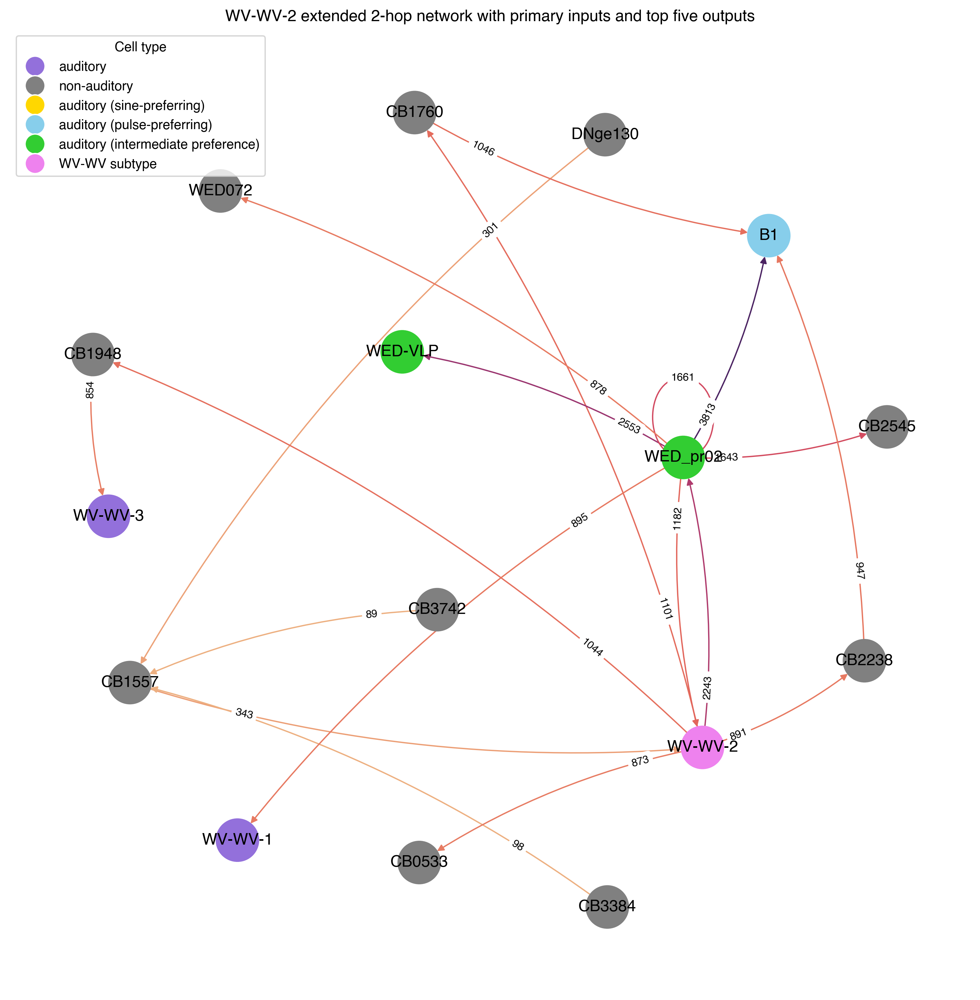

In [192]:
Gwv2 = nx.MultiDiGraph()

for i, row in wv2_extendednetwork.iterrows():
    Gwv2.add_node(row['source'], label=row['source'], color=row['source_color'])
    Gwv2.add_node(row['target'], label=row['target'], color=row['target_color'])

for i, row in wv2_extendednetwork.iterrows():
    Gwv2.add_edge(row['source'], row['target'], weight=row['syn_count'])

plt.figure(figsize=(10, 10))
pos=nx.arf_layout(Gwv2, seed=1, scaling=2)

nx.draw(Gwv2, pos, with_labels=True,
        node_color=[data['color'] for node, data in Gwv2.nodes(data=True)],
        node_size=1000,
        edge_cmap=seaborn.color_palette('flare', as_cmap=True),
        edge_color=[data['weight'] for u, v, data in Gwv2.edges(data=True)],
        connectionstyle='arc3, rad=0.1')

nx.draw_networkx_edge_labels(Gwv2, pos,
                             edge_labels={(u, v): d['weight'] for u, v, d in Gwv2.edges(data=True)},
                             label_pos=0.2,
                             font_size=8,
                             connectionstyle='arc3, rad=0.1')

plt.title('WV-WV-2 extended 2-hop network with primary inputs and top five outputs')
plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='auditory', markerfacecolor='mediumpurple', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='non-auditory', markerfacecolor='grey', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (sine-preferring)', markerfacecolor='gold', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (pulse-preferring)', markerfacecolor='skyblue', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (intermediate preference)', markerfacecolor='limegreen', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='WV-WV subtype', markerfacecolor='violet', markersize=15)
    ],
    title="Cell type",
    loc="upper left",
)


## WV-WV-3

In [194]:
wv3_inputs_grouped = wvwv3_inputs.groupby(['type_pre', 'type_post', 'nt_type', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False)
wv3_outputs_grouped = wvwv3_outputs.groupby(['type_pre', 'type_post', 'nt_type', 'pref_pre', 'pref_post', 'class_pre', 'class_post'], as_index=False, dropna=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False)

wv3_input_types = wv3_inputs_grouped['type_pre'].head(5)
wv3_output_types = wv3_outputs_grouped['type_post'].head(5)

In [195]:
#primary inputs of wv-wv-3
wv3_primary_inputs = primacy[primacy['wvwv3_rank']==0]['type_pre'].tolist()
wv3_primary_inputs

['JO-A', 'CB1948', 'DNg40', 'CB0261', 'CB3105', 'DNg30', 'DNp55', 'CB1065']

In [196]:
#all inputs to wv-wv-3's primary inputs
wv3_primaryinputs_inputs = conns_types[conns_types['type_post'].isin(wv3_primary_inputs)][['type_pre']].drop_duplicates()
wv3_primaryinputs_inputs

,type_pre
1994,LHAD1g1
2706,DNp70
2917,AVLP340
4310,AVLP083
7444,PVLP010
...,...
3648807,AVLP_pr05
3670715,CB1638
3691489,AN_GNG_165
3706513,PS002


In [197]:
#primary inputs of wv-wv-3's primary inputs
wv3_primaryinputs_primacy = wv3_primaryinputs_inputs.copy()

for idx, row in wv3_primaryinputs_primacy.iterrows():
    outputs = conns_types[conns_types['type_pre']==row.type_pre].groupby('type_post', as_index=False)[['syn_count']].sum().sort_values(by='syn_count', ascending=False, ignore_index=True)

    input1 = outputs[outputs['type_post']==wv3_primary_inputs[0]]
    if len(input1) == 0:
        wv3_primaryinputs_primacy.loc[idx, 'input1_rank'] = np.nan
        wv3_primaryinputs_primacy.loc[idx, 'input1_syncount'] = np.nan
    else:
        wv3_primaryinputs_primacy.loc[idx, 'input1_rank'] = input1.index.values[0]
        wv3_primaryinputs_primacy.loc[idx, 'input1_syncount'] = input1['syn_count'].values[0]

    input2 = outputs[outputs['type_post']==wv3_primary_inputs[1]]
    if len(input2) == 0:
        wv3_primaryinputs_primacy.loc[idx, 'input2_rank'] = np.nan
        wv3_primaryinputs_primacy.loc[idx, 'input2_syncount'] = np.nan
    else:
        wv3_primaryinputs_primacy.loc[idx, 'input2_rank'] = input2.index.values[0]
        wv3_primaryinputs_primacy.loc[idx, 'input2_syncount'] = input2['syn_count'].values[0]

    input3 = outputs[outputs['type_post']==wv3_primary_inputs[2]]
    if len(input3) == 0:
        wv3_primaryinputs_primacy.loc[idx, 'input3_rank'] = np.nan
        wv3_primaryinputs_primacy.loc[idx, 'input3_syncount'] = np.nan
    else:
        wv3_primaryinputs_primacy.loc[idx, 'input3_rank'] = input3.index.values[0]
        wv3_primaryinputs_primacy.loc[idx, 'input3_syncount'] = input3['syn_count'].values[0]

    input4 = outputs[outputs['type_post']==wv3_primary_inputs[3]]
    if len(input4) == 0:
        wv3_primaryinputs_primacy.loc[idx, 'input4_rank'] = np.nan
        wv3_primaryinputs_primacy.loc[idx, 'input4_syncount'] = np.nan
    else:
        wv3_primaryinputs_primacy.loc[idx, 'input4_rank'] = input4.index.values[0]
        wv3_primaryinputs_primacy.loc[idx, 'input4_syncount'] = input4['syn_count'].values[0]

    input5 = outputs[outputs['type_post']==wv3_primary_inputs[4]]
    if len(input5) == 0:
        wv3_primaryinputs_primacy.loc[idx, 'input5_rank'] = np.nan
        wv3_primaryinputs_primacy.loc[idx, 'input5_syncount'] = np.nan
    else:
        wv3_primaryinputs_primacy.loc[idx, 'input5_rank'] = input5.index.values[0]
        wv3_primaryinputs_primacy.loc[idx, 'input5_syncount'] = input5['syn_count'].values[0]

    input6 = outputs[outputs['type_post']==wv3_primary_inputs[5]]
    if len(input6) == 0:
        wv3_primaryinputs_primacy.loc[idx, 'input6_rank'] = np.nan
        wv3_primaryinputs_primacy.loc[idx, 'input6_syncount'] = np.nan
    else:
        wv3_primaryinputs_primacy.loc[idx, 'input6_rank'] = input6.index.values[0]
        wv3_primaryinputs_primacy.loc[idx, 'input6_syncount'] = input6['syn_count'].values[0]

    input7 = outputs[outputs['type_post']==wv3_primary_inputs[6]]
    if len(input7) == 0:
        wv3_primaryinputs_primacy.loc[idx, 'input7_rank'] = np.nan
        wv3_primaryinputs_primacy.loc[idx, 'input7_syncount'] = np.nan
    else:
        wv3_primaryinputs_primacy.loc[idx, 'input7_rank'] = input7.index.values[0]
        wv3_primaryinputs_primacy.loc[idx, 'input7_syncount'] = input7['syn_count'].values[0]

    input8 = outputs[outputs['type_post']==wv3_primary_inputs[7]]
    if len(input8) == 0:
        wv3_primaryinputs_primacy.loc[idx, 'input8_rank'] = np.nan
        wv3_primaryinputs_primacy.loc[idx, 'input8_syncount'] = np.nan
    else:
        wv3_primaryinputs_primacy.loc[idx, 'input8_rank'] = input8.index.values[0]
        wv3_primaryinputs_primacy.loc[idx, 'input8_syncount'] = input8['syn_count'].values[0]

wv3_primaryinputs_primacy


,type_pre,input1_rank,input1_syncount,input2_rank,input2_syncount,input3_rank,input3_syncount,input4_rank,input4_syncount,input5_rank,input5_syncount,input6_rank,input6_syncount,input7_rank,input7_syncount,input8_rank,input8_syncount
1994,LHAD1g1,NaN,NaN,NaN,NaN,2.0,436.0,NaN,NaN,NaN,NaN,NaN,NaN,274.0,6.0,NaN,NaN
2706,DNp70,NaN,NaN,NaN,NaN,1.0,461.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2917,AVLP340,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,389.0,NaN,NaN
4310,AVLP083,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.0,356.0,NaN,NaN
7444,PVLP010,NaN,NaN,56.0,80.0,3.0,325.0,17.0,173.0,NaN,NaN,NaN,NaN,67.0,64.0,221.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3648807,AVLP_pr05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68.0,5.0
3670715,CB1638,NaN,NaN,NaN,NaN,22.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3691489,AN_GNG_165,NaN,NaN,NaN,NaN,41.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3706513,PS002,NaN,NaN,NaN,NaN,136.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [198]:
#list used in for loop for reference since i decided not to use cell type names (input1 = JO-A, etc)
wv3_primary_inputs

['JO-A', 'CB1948', 'DNg40', 'CB0261', 'CB3105', 'DNg30', 'DNp55', 'CB1065']

In [199]:
#find primary input for each wv-wv-3 primary input

input1inputs = wv3_primaryinputs_primacy[wv3_primaryinputs_primacy['input1_rank']==0]['type_pre'].tolist()
input1conns = conns_types_grouped[(conns_types_grouped['type_pre'].isin(input1inputs))&(conns_types_grouped['type_post']==wv3_primary_inputs[0])]

input2inputs = wv3_primaryinputs_primacy[wv3_primaryinputs_primacy['input2_rank']==0]['type_pre'].tolist()
input2conns = conns_types_grouped[(conns_types_grouped['type_pre'].isin(input2inputs))&(conns_types_grouped['type_post']==wv3_primary_inputs[1])]

input3inputs = wv3_primaryinputs_primacy[wv3_primaryinputs_primacy['input3_rank']==0]['type_pre'].tolist()
input3conns = conns_types_grouped[(conns_types_grouped['type_pre'].isin(input3inputs))&(conns_types_grouped['type_post']==wv3_primary_inputs[2])]

input4inputs = wv3_primaryinputs_primacy[wv3_primaryinputs_primacy['input4_rank']==0]['type_pre'].tolist()
input4conns = conns_types_grouped[(conns_types_grouped['type_pre'].isin(input4inputs))&(conns_types_grouped['type_post']==wv3_primary_inputs[3])]

input5inputs = wv3_primaryinputs_primacy[wv3_primaryinputs_primacy['input5_rank']==0]['type_pre'].tolist()
input5conns = conns_types_grouped[(conns_types_grouped['type_pre'].isin(input5inputs))&(conns_types_grouped['type_post']==wv3_primary_inputs[4])]

input6inputs = wv3_primaryinputs_primacy[wv3_primaryinputs_primacy['input6_rank']==0]['type_pre'].tolist()
input6conns = conns_types_grouped[(conns_types_grouped['type_pre'].isin(input6inputs))&(conns_types_grouped['type_post']==wv3_primary_inputs[5])]

input7inputs = wv3_primaryinputs_primacy[wv3_primaryinputs_primacy['input7_rank']==0]['type_pre'].tolist()
input7conns = conns_types_grouped[(conns_types_grouped['type_pre'].isin(input7inputs))&(conns_types_grouped['type_post']==wv3_primary_inputs[6])]

input8inputs = wv3_primaryinputs_primacy[wv3_primaryinputs_primacy['input8_rank']==0]['type_pre'].tolist()
input8conns = conns_types_grouped[(conns_types_grouped['type_pre'].isin(input8inputs))&(conns_types_grouped['type_post']==wv3_primary_inputs[7])]


In [200]:
wv3pi_to_pi = pd.concat([input1conns, input2conns, input3conns, input4conns, input5conns, input6conns, input7conns, input8conns])
wv3pi_to_pi

,type_pre,type_post,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
18083,AN_GNG_AMMC_1,JO-A,GABA,NaN,NaN,non-auditory,auditory,1331
2867,AN_AMMC_SAD_1,JO-A,GABA,NaN,NaN,non-auditory,auditory,601
169215,CB1969,JO-A,GABA,NaN,NaN,non-auditory,auditory,232
2868,AN_AMMC_SAD_1,JO-A,GLUT,NaN,NaN,non-auditory,auditory,142
218457,CB3552,JO-A,GABA,NaN,NaN,non-auditory,auditory,124
405670,PVLP062,DNg40,ACH,NaN,NaN,non-auditory,non-auditory,319
49955,AVLP093,DNg40,GABA,NaN,NaN,non-auditory,non-auditory,236
12367,AN_GNG_146,DNg40,ACH,NaN,NaN,non-auditory,non-auditory,46
16492,AN_GNG_61,DNg40,ACH,NaN,NaN,non-auditory,non-auditory,25
77926,AVLP594,DNg30,SER,NaN,NaN,non-auditory,non-auditory,414


In [201]:
#two hop outputs

wv3twohops_downstream = conns_types_grouped[conns_types_grouped['type_pre'].isin(wv3_output_types)].head(10)
wv3twohops_downstream

,type_pre,type_post,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
489919,WV-WV-3,AMMC-A1,GABA,NaN,NaN,auditory,auditory,1381
490005,WV-WV-3,DNp01,GABA,NaN,NaN,auditory,auditory,1372
490006,WV-WV-3,DNp02,GABA,NaN,NaN,auditory,non-auditory,1136
490036,WV-WV-3,WV-WV-3,GABA,NaN,NaN,auditory,auditory,931
489998,WV-WV-3,DNg24,GABA,NaN,NaN,auditory,non-auditory,718
2777,AMMC-A1,AMMC-A1,ACH,NaN,NaN,auditory,auditory,651
260900,DNg24,WV-WV-1,GABA,NaN,NaN,non-auditory,auditory,600
260902,DNg24,WV-WV-3,GABA,NaN,NaN,non-auditory,auditory,515
271097,DNp02,NaN,ACH,NaN,NaN,non-auditory,non-auditory,496
489932,WV-WV-3,B1,GABA,NaN,pulse,auditory,auditory,468


In [202]:
#concat

wv3_priminput_conns = wv3_inputs_grouped[wv3_inputs_grouped['type_pre'].isin(wv3_primary_inputs)]
wv3_t5output_conns = wv3_outputs_grouped[wv3_outputs_grouped['type_post'].isin(wv3_output_types)]

wv3_extendednetwork = pd.concat([wv3pi_to_pi, wv3_priminput_conns, wv3_t5output_conns, wv3twohops_downstream]).rename(columns={'type_pre':'source', 'type_post':'target'})
wv3_extendednetwork

,source,target,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count
18083,AN_GNG_AMMC_1,JO-A,GABA,NaN,NaN,non-auditory,auditory,1331
2867,AN_AMMC_SAD_1,JO-A,GABA,NaN,NaN,non-auditory,auditory,601
169215,CB1969,JO-A,GABA,NaN,NaN,non-auditory,auditory,232
2868,AN_AMMC_SAD_1,JO-A,GLUT,NaN,NaN,non-auditory,auditory,142
218457,CB3552,JO-A,GABA,NaN,NaN,non-auditory,auditory,124
405670,PVLP062,DNg40,ACH,NaN,NaN,non-auditory,non-auditory,319
49955,AVLP093,DNg40,GABA,NaN,NaN,non-auditory,non-auditory,236
12367,AN_GNG_146,DNg40,ACH,NaN,NaN,non-auditory,non-auditory,46
16492,AN_GNG_61,DNg40,ACH,NaN,NaN,non-auditory,non-auditory,25
77926,AVLP594,DNg30,SER,NaN,NaN,non-auditory,non-auditory,414


In [203]:
#color code

wv3_extendednetwork['source_color'] = wv3_extendednetwork['class_pre'].map(class_colordic)
wv3_extendednetwork['target_color'] = wv3_extendednetwork['class_post'].map(class_colordic)

wv3_extendednetwork.loc[wv3_extendednetwork['pref_pre']=='intermediate', 'source_color'] = 'limegreen'
wv3_extendednetwork.loc[wv3_extendednetwork['pref_post']=='intermediate', 'target_color'] = 'limegreen'
wv3_extendednetwork.loc[wv3_extendednetwork['pref_post']=='pulse', 'target_color'] = 'skyblue'

wv3_extendednetwork.loc[wv3_extendednetwork['source']=='WV-WV-3', 'source_color'] = 'violet'
wv3_extendednetwork.loc[wv3_extendednetwork['target']=='WV-WV-3', 'target_color'] = 'violet'

wv3_extendednetwork

,source,target,nt_type,pref_pre,pref_post,class_pre,class_post,syn_count,source_color,target_color
18083,AN_GNG_AMMC_1,JO-A,GABA,NaN,NaN,non-auditory,auditory,1331,grey,mediumpurple
2867,AN_AMMC_SAD_1,JO-A,GABA,NaN,NaN,non-auditory,auditory,601,grey,mediumpurple
169215,CB1969,JO-A,GABA,NaN,NaN,non-auditory,auditory,232,grey,mediumpurple
2868,AN_AMMC_SAD_1,JO-A,GLUT,NaN,NaN,non-auditory,auditory,142,grey,mediumpurple
218457,CB3552,JO-A,GABA,NaN,NaN,non-auditory,auditory,124,grey,mediumpurple
405670,PVLP062,DNg40,ACH,NaN,NaN,non-auditory,non-auditory,319,grey,grey
49955,AVLP093,DNg40,GABA,NaN,NaN,non-auditory,non-auditory,236,grey,grey
12367,AN_GNG_146,DNg40,ACH,NaN,NaN,non-auditory,non-auditory,46,grey,grey
16492,AN_GNG_61,DNg40,ACH,NaN,NaN,non-auditory,non-auditory,25,grey,grey
77926,AVLP594,DNg30,SER,NaN,NaN,non-auditory,non-auditory,414,grey,grey


In [204]:
#what are the additional type names for source/target cells in this network?

wv3_extendednetwork_sources = wv3_extendednetwork['source'].drop_duplicates()
wv3_extendednetwork_targets = wv3_extendednetwork['target'].drop_duplicates()

wv3_extendednetwork_celltypes = pd.concat([wv3_extendednetwork_sources, wv3_extendednetwork_targets]).drop_duplicates().tolist()

celltypes[celltypes['type'].isin(wv3_extendednetwork_celltypes)][['type', 'additional_type(s)']].drop_duplicates()

,type,additional_type(s)
220,WV-WV-3,NaN
3467,JO-A,NaN
5867,CB1969,NaN
6206,AN_GNG_146,NaN
8030,CB1192,NaN
10957,CB1969,SAD_pr02
12708,AMMC-A1,A1
13216,CB3105,NaN
18958,CB1948,NaN
25081,CB1065,NaN


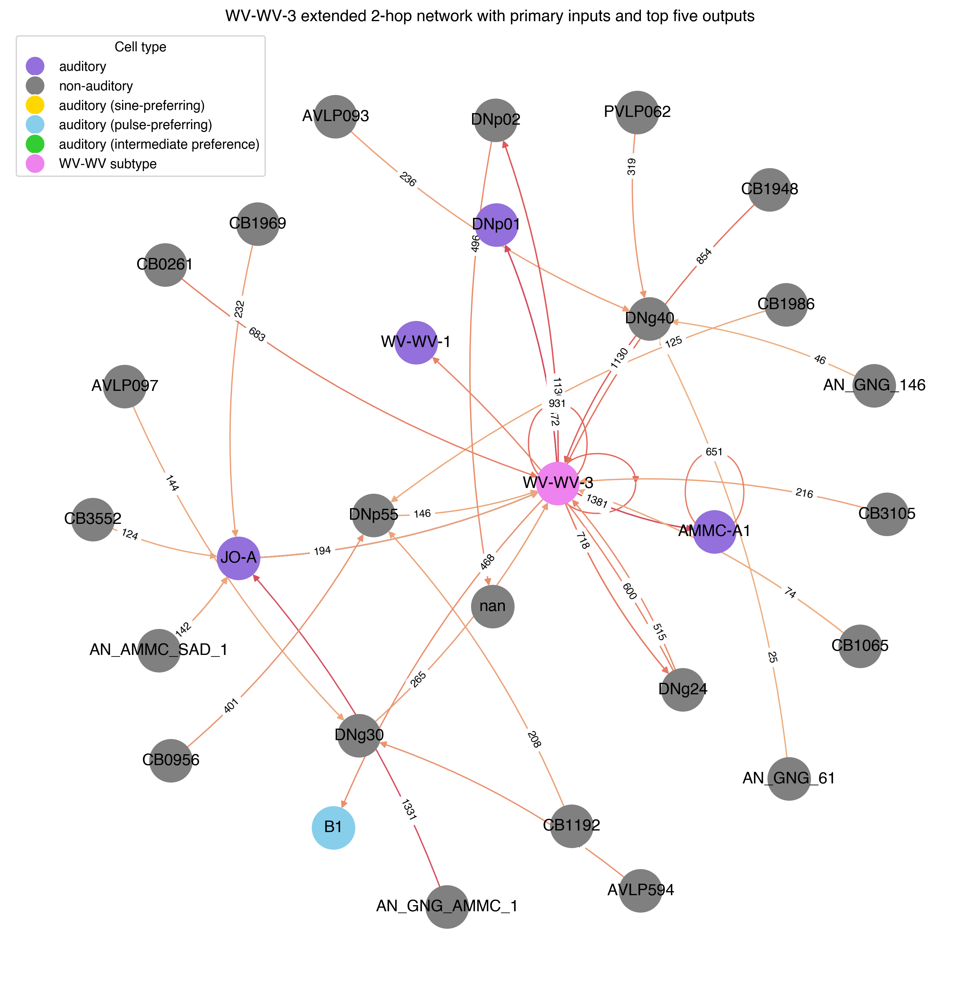

In [205]:
#graph

Gwv3 = nx.MultiDiGraph()

for i, row in wv3_extendednetwork.iterrows():
    Gwv3.add_node(row['source'], label=row['source'], color=row['source_color'])
    Gwv3.add_node(row['target'], label=row['target'], color=row['target_color'])

for i, row in wv3_extendednetwork.iterrows():
    Gwv3.add_edge(row['source'], row['target'], weight=row['syn_count'])

plt.figure(figsize=(10, 10))
pos=nx.arf_layout(Gwv3, seed=2, scaling=2, a=2)

nx.draw(Gwv3, pos, with_labels=True,
        node_color=[data['color'] for node, data in Gwv3.nodes(data=True)],
        node_size=1000,
        edge_cmap=seaborn.color_palette('flare', as_cmap=True),
        edge_color=[data['weight'] for u, v, data in Gwv3.edges(data=True)],
        connectionstyle='arc3, rad=0.1')

nx.draw_networkx_edge_labels(Gwv3, pos,
                             edge_labels={(u, v): d['weight'] for u, v, d in Gwv3.edges(data=True)},
                             label_pos=0.25,
                             font_size=8,
                             connectionstyle='arc3, rad=0.1')

plt.title('WV-WV-3 extended 2-hop network with primary inputs and top five outputs')
plt.legend(
    handles=[
        plt.Line2D([0], [0], marker='o', color='w', label='auditory', markerfacecolor='mediumpurple', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='non-auditory', markerfacecolor='grey', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (sine-preferring)', markerfacecolor='gold', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (pulse-preferring)', markerfacecolor='skyblue', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='auditory (intermediate preference)', markerfacecolor='limegreen', markersize=15),
        plt.Line2D([0], [0], marker='o', color='w', label='WV-WV subtype', markerfacecolor='violet', markersize=15)
    ],
    title="Cell type",
    loc="upper left",
)
